In [1]:
import pyreadr
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import tensorflow as tf
from tensorflow.keras.layers import LSTM, Dense, RepeatVector, TimeDistributed, Conv1D, Dropout
from tensorflow.keras import  Sequential
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.callbacks import ReduceLROnPlateau
import matplotlib.pyplot as plt
import holidays
import json
from tensorflow.keras.models import Model
from cond_rnn import ConditionalRecurrent
from sklearn.model_selection import KFold
import pickle
import os

#from imblearn.over_sampling import RandomOverSampler, SMOTE

import keras_tuner as kt

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
# Estos datos por su frexuencia pesan como 1 GB y no se si estarán disponibles en el repo. Me los dió Aaron y son los datos históricos de CPS Getafe.
df = pyreadr.read_r('./Datos_v7.RData')[None]

PyreadrError: File b'./Datos_v7.RData' does not exist!

In [ ]:
# Funcion auxiliar
def pintar_predicciones(valores_reales, predicciones):
    fig, ax = plt.subplots(figsize=(15, 7))
    ax.plot(valores_reales, color='green', label='Medidas Reales')
    ax.plot(predicciones, color='red', label='Predicción 24h antes cada dia')
    ax.set_xlabel('timesteps')
    ax.set_ylabel('Potencia_activa_total')
    ax.set_title('TEST SET Serie Potencia total')
    plt.xticks(rotation=45)
    plt.show()
    
    fig, ax = plt.subplots(figsize=(15, 7))
    ax.plot(valores_reales[0:300], color='green', label='Medidas Reales')
    ax.plot(predicciones[0:300], color='red', label='Predicción 24h antes cada dia')
    ax.set_xlabel('timesteps')
    ax.set_ylabel('Potencia_activa_total')
    ax.set_title('TEST SET Serie Potencia total')
    plt.xticks(rotation=45)
    plt.show()

## Cargamos datos historicos de consumo, histórico de clima

In [ ]:
# PROCESADO DE DATASET NO CONFIGURABLE Y QUE NO SE NECESITA REPETIR ENTRE EXPERIMENTOS

# Cargamos datos climaticos getafe 01-2022 / 05-2023
with open('./observaciones_clima_getafe.json') as f:
    json_data = json.load(f)

temps = pd.DataFrame(json_data, columns=["fecha", "tmed", "tmin", "tmax"])

# Cambiar formato de los campos
temps['fecha'] = pd.to_datetime(temps['fecha'])
temps["tmed"] = temps["tmed"].str.replace(",", ".").astype(float)
temps["tmin"] = temps["tmin"].str.replace(",", ".").astype(float)
temps["tmax"] = temps["tmax"].str.replace(",", ".").astype(float)
temps = temps.rename(columns={'fecha':'Fecha'})
temps = temps.set_index('Fecha')


# PROCESADO DE DATOS

# Convierte la columna 'timestamp' en formato de tiempo
df['Fecha'] = pd.to_datetime(df['Fecha'])


# % NaN
nans = df.isna().sum()
nans = nans / len(df) * 100
nans = nans.sort_values(ascending=True)
#print('Analisis de NaN en el dataframe: \n')
#print(nans)

# Elimino las features con mas de un 5% de NaN y todas las filas con nan en "Potencia_activa_total"
features = nans[nans<5].index.tolist()
df = df[features]
print("Features filtradas")
print(features)

df.dropna(subset=["Potencia_activa_total"], inplace=True)


#Filtramos outliers
print("Old Shape: ", df.shape)
Q1 = np.percentile(df['Potencia_activa_total'], 25)
Q3 = np.percentile(df['Potencia_activa_total'], 75)
print(f'Q1:{Q1},  Q2:{Q3}')
IQR = Q3 - Q1
upper=Q3+1.5*IQR
mask = df['Potencia_activa_total']<=upper
df = df[mask]
print("Upper Bound:",upper)
#Below Lower bound
lower=Q1-1.5*IQR
mask = df['Potencia_activa_total']>=lower
df = df[mask]
print("lower Bound",lower)
print("New Shape: ", df.shape)


#  Agrupo por horas y hago media. elimino dias sin todas sus horas.

df['Fecha'] = df['Fecha'].dt.floor('H')
df = df.groupby('Fecha', as_index=False).mean()
# elimino dias con horas sin muestras
df['day'] = df['Fecha'].dt.floor('D')


def fun(df):
    if len(df)==24:
        return df

df = df.groupby('day', as_index=False).apply(fun)
df = df.drop(['day'], axis=1)
df.index = pd.DatetimeIndex(df['Fecha'])
df = df.drop(['Fecha'], axis=1)

# Elimino dias 11 y 12 de agosto donde hay datos de consumo total anómalos
delete_index = pd.date_range('2022-08-11 00:00:00', '2022-08-12 23:00:00', freq='H')
df = df.drop(index=delete_index)


#  Normalizar datos mediante Standard Scaler 

# separo las fechas
dates = df.index

# escalo los datos
scaler = StandardScaler()
scaler.fit(df)
df = scaler.transform(df)

# Guardo desviacion tipica y media de los datos de consumo total para desescalar las predicciones
desviacion_tipica = np.sqrt(scaler.var_)[6]
media = scaler.mean_[6]
print(f'desviación típica: {desviacion_tipica:.2f}, media: {media:.2f}')

# Dataframe con indice de vuelta
df = pd.DataFrame(df, columns=features[1:])
df.index = dates  


# Guardo una copia para poder cambiar el dataset entre experimentos
df_copia = df.copy()

Features filtradas
['Fecha', 'Potencia_activa_total', 'Potencia_aparente_L2', 'Potencia_aparente_L1', 'Corriente_L2', 'Potencia_reactiva_total', 'Potencia_activa_L3', 'Frecuencia', 'Corriente_L1', 'Potencia_reactiva_L1', 'Corriente_neutro', 'Potencia_aparente_L3', 'Corriente_L3', 'Factor_potencia_total', 'Potencia_activa_L1', 'Potencia_aparente_total', 'Potencia_activa_L2', 'Potencia_reactiva_L2']
Old Shape:  (3872321, 18)
Q1:62478.4765625,  Q2:146780.640625
Upper Bound: 273233.88671875
lower Bound -63974.76953125
New Shape:  (3848763, 18)
desviación típica: 46.73, media: 52.32


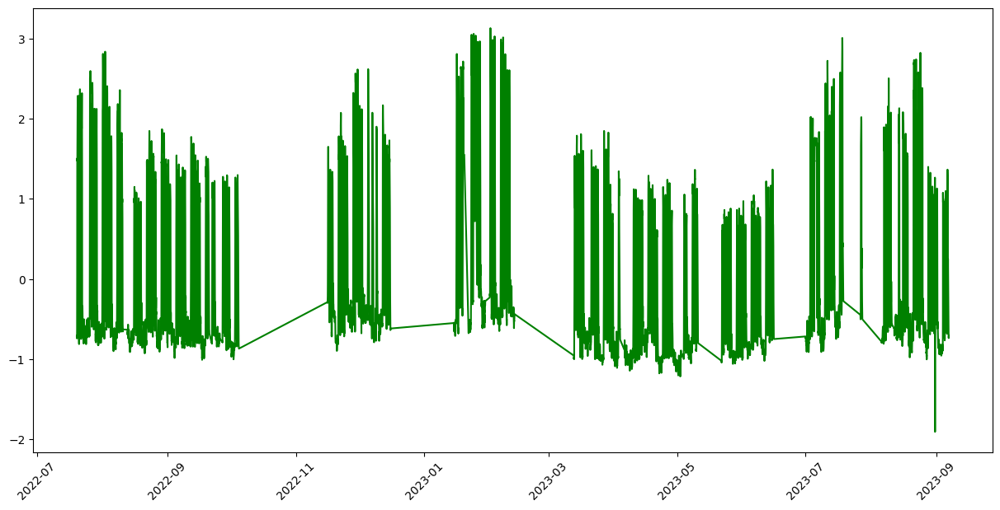

In [5]:
fig, ax = plt.subplots(figsize=(15, 7))
ax.plot(df["Potencia_activa_total"], color='green', label='Medidas Reales')
plt.xticks(rotation=45)
plt.show()

# Configuración de las input features

In [6]:
# Aqui lo que hice fue configurar diferentes features de entrada para el dataset y probar diferentes combinaciones.   
# Algunos de esos experimentos se realizan mas abajo (una vez ya seleccioné la arquitectura elegida) y se guardan los resultados en un csv llamado dataset_inputs

# Dataset
SOLO_POTENCIA_TOTAL = False
ES_LABORABLE = True
DIA_SEMANA = True
MES = True
VARIABLES_DIA_ANTERIOR = True
TEMPERATURAS = True
FOLDS = 6
SHUFFLE_TRAIN_VAL_DAYS = True

#   Config Ventana
INPUT_DAYS = 1
OVERSAMPLING = False

# LOSS :   MSE (Error abs al cuadrado)  MAE (error absoluto medio)  MAPE(Error absoluto medio en porcentaje)
LOSS = "mse"
BATCH_SIZE = 64


## Creamos el conjunto de entrenamiento

#### Añadimos features:  | es_labolable | temperaturas | dia_semana |  Mes ciclico |

In [21]:
# CAMBIOS CONFIGURABLES EN EL DATASET
df = df_copia.copy()

if SOLO_POTENCIA_TOTAL:
    df = df['Potencia_activa_total'].to_frame()

if DIA_SEMANA:
    # Añadimos codificación de dia de la semana
    df['dia_sin'] = df.index.map(lambda x: np.sin(x.weekday() * (2.*np.pi/6)))
    df['dia_cos'] = df.index.map(lambda x: np.cos(x.weekday() * (2.*np.pi/6)))
    
if MES:
    df['mes_sin'] = df.index.map(lambda x: np.sin(x.month - 1 * (2.*np.pi/12)))
    df['mes_cos'] = df.index.map(lambda x: np.cos(x.month - 1 * (2.*np.pi/12)))
    
if VARIABLES_DIA_ANTERIOR:
    arr = np.array(df['Potencia_activa_total'])
    arr_media = []
    arr_min = []
    arr_max = []
    for i in range(int(len(arr)/24)):
        for a in range(24):
            arr_media.append(np.mean(arr[i*24:(i+1)*24]))
            arr_min.append(np.min(arr[i*24:(i+1)*24]))
            arr_max.append(np.max(arr[i*24:(i+1)*24]))
        
        # AÑADO 24 0s YA QUE DEBEN ESTAR EN LAS FILAS DEL DIA SIGUIENTE
        # Aunque el dia anterior no siempre es ayer ya que faltan dias en el dataset, no pasa nada ya que al no existir el anterior, no hay X y no se creará ese dia como target.
    df['max_dia_ant'] = np.concatenate([np.zeros(24), np.array(arr_min)[:-24]])
    df['min_dia_ant'] = np.concatenate([np.zeros(24), np.array(arr_max)[:-24]])
    df['media_dia_ant'] = np.concatenate([np.zeros(24), np.array(arr_media)[:-24]])
    


# Añado campo Es_Laborable que vale 0 para dias festivos en Madrid y fines de semana, 1 en caso contrario
holidays_list = []

if ES_LABORABLE:
    madrid_holidays = holidays.Spain(prov='MD')

    holidays_list = []

    def es_laborable(fecha):
        dia_semana = fecha.weekday()
        if dia_semana >= 5:
            return 0  # Fin de semana o festivo
        if fecha in madrid_holidays:
            holidays_list.append(fecha)
            return 0
        else:
            return 1  # Entre semana

    # Aplicar la función a cada índice del DataFrame
    df['es_laborable'] = df.index.map(lambda x: es_laborable(x))
    
    # Esto saca todas las fiestas del dataset
    holidays_list = list(set([x.floor('D') for x in holidays_list]))
    holidays_list = pd.to_datetime(holidays_list)
    
    

if TEMPERATURAS:
    # separo las fechas
    dates = temps.index
    features = list(temps.columns)
    # escalo los datos
    scaler = StandardScaler()
    scaler.fit(temps)
    temps = scaler.transform(temps)
    # Dataframe con indice de vuelta
    temps = pd.DataFrame(temps, columns=features)
    temps.index = dates        

    # Agregamos los datos del clima a cada primera hora del dia 00:00, las demas horas del dia quedan rellenas de NaN
    df = df.join(temps, on='Fecha')

    # Elimino nans de forma temporal de esta forma 
    df = df.fillna(method='ffill').fillna(method='bfill')



df = df.fillna(method='ffill').fillna(method='bfill')
    
# TO DO
#    Probar con GPUs

#    funciones de pérdida mas adecuadas? 

#    Dropout de input y de unidades ocultas, por separado

#    Optimizar por parámetros Convolucional


#    ¿sustituir nans por valor medio? 
#    máscaras (dropout para nans)   

# DONE
# Implementar Keras Tuner
#        filters y kernel size para conv por separado

#    Validación cruzada
#    Oversampling semanas con festivos
#    Bajar ventana
#    Codificacion sin cos de dia de la semana
#    Codificaicon mes
#    Insertar min max media del dia anterior
#    Añadir variable festivo en seq entrada

#### Función para crear ventanas

In [22]:
# Crear dataset de ventanas de tamaño determinado por INPUT_DAYS

# DE MOMENTO OUTPUT TIMESTEPS ES 1 DIA SIEMPRE
def crear_ventanas(df, INPUT_DAYS, variables_condicionales, holidays_list):
    dates = df.index
    X_seq, X_condition, y, Date = [], [], [], []

    
    for date in dates.normalize().unique():
        input_start = date
        input_end = date + pd.Timedelta(days=INPUT_DAYS-1, hours=23)  # calculamos la fecha de fin de la secuencia
        target_start = date + pd.Timedelta(days=INPUT_DAYS)
        target_end = target_start + pd.Timedelta(hours=23)
        

        if all(pd.date_range(input_start, target_end, freq='H').isin(dates)):  # verificamos si existe una secuencia completa de longitud len_seq
            input_seq = pd.date_range(input_start, input_end, freq='H')
            target_seq = pd.date_range(target_start, target_end, freq='H')
            
            """
            print("---------------")
            print(input_start, input_end)
            print(target_start, target_end)
            print(input_seq)
            print(target_seq)
            """
            # Si solo hemos cogido la variable consumo total del DF, ajustamos las dimensiones para la LSTM
            if str(type(df)) == "<class 'pandas.core.series.Series'>":
                y.append(np.expand_dims(df.loc[target_seq].to_numpy().astype('float32'), axis=-1))
                X_seq.append(np.expand_dims(df.loc[input_seq].to_numpy().astype('float32'), axis=-1))
                
            # En caso contrario solamente creamos las secuencias
            else:
                y.append(df.loc[target_seq]["Potencia_activa_total"].to_numpy().astype('float32'))
                X_seq.append(df.loc[input_seq].to_numpy().astype('float32')[:,:-variables_condicionales])
                X_condition.append(df.loc[target_seq].iloc[0, -variables_condicionales:].to_numpy().astype('float32'))
                Date.append(target_start)
                """
                print(input_seq)
                print(target_seq)
                display(X_seq[-1])
                display(X_condition[-1])
                display(y[-1])
                print('-------------')
                """
                
    return X_seq, X_condition, y, Date


### Creacion de ventanas y oversampling

In [ ]:
# Finalmente al cambiar arquitecturas y el dataset, no fue necesario aplicar oversampling a los días festivos.  
# (En estos experimentos se relizo con una libreria que nos daba los festivos de madrid para la planta de getafe cps)
# Sin embargo a la hora del entrenamiento e inferencia de los modelos de la API, estos datos vienen dados en el json  con el parámetro  "is_workday" (ya esta hecha esta parte no preocuparse)

#Calculo numero de variables condicionales del dia a predecir (temperaturas y es_laboral)
#  A ver, esto es un poco raro, lo que hice fue que como iba a hacer pruebas con diferentes features de entrada, en el DF la primera columna era el consumo y luego estaban las features. Por ello, 
#   a la hora de crear el dataset, al crear las ventanas, se congen por un lado los consumos del dia anterior (X_consumos), los consumos a predecir (y) y las variables extra "X_condicional" que son las ultimas 
#   columnas del dia den entrada.  El numero de columnas depende de la configuracion del dataset del experimento. Este parámetro sirve para que se haga bien el esa parte del dataset 
global variables_condicionales 
variables_condicionales = 0
if ES_LABORABLE:
    variables_condicionales += 1
if DIA_SEMANA:
    variables_condicionales += 2
if MES:
    variables_condicionales += 2
if TEMPERATURAS:
    variables_condicionales += temps.shape[1]
if VARIABLES_DIA_ANTERIOR:
    variables_condicionales += 3

print(f'Variables Condicionales: {variables_condicionales}')

X_seq, X_condition, y, Dates  = crear_ventanas(df, INPUT_DAYS, variables_condicionales, holidays_list)


# X_condicional son unas features de entrada, que incluyen la posicion ciclica del mes, predicciones de clima etc.  Estas features condicionan el estado inicial de la LSTM.
#  Para ello se ha empleado una libreria llamada "cond_rnn"

Variables Condicionales: 11


#### Se realiza oversampling de las ventanas con target festivo dentro del training set

In [24]:
# Esta parte del oversampling olvidadla.  Siempre pongo OVERSAMPLING a False
# Obtenemos el indice de cada dia festivo para identificar a que conjunto pertenece
if ES_LABORABLE and OVERSAMPLING:
    indices_festivos = []
    for x in holidays_list:
        if x in Dates:
            indices_festivos.append(Dates.index(x))
    print(indices_festivos)
else: 
    indices_festivos = None

    
# CROSS VALIDATION  ***(y OVERSAMPLING FESTIVOS)
def get_folds(X_seq, X_condition, y, SHUFFLE_TRAIN_VAL_DAYS, indices_festivos=None):
    kf = KFold(n_splits=FOLDS)
    train, val, test = [], [], []
    for i, (train_index, test_index) in enumerate(kf.split(Dates, y)):
        
        if SHUFFLE_TRAIN_VAL_DAYS:
            np.random.shuffle(train_index)
        
        # Cogemos el 20% de train y lo convertimos en validacion
        val_index = train_index[int(len(train_index)*0.8):]
        train_index = train_index[:int(len(train_index)*0.8)]
        
        #val
        #Dates_test = [Dates[x] for x in test_index]
        X_condition_val = np.array([X_condition[x] for x in val_index])
        X_seq_val = np.array([X_seq[x] for x in val_index])
        y_val = np.array([y[x] for x in val_index])
        
        #Test
        #Dates_test = [Dates[x] for x in test_index]
        X_condition_test = np.array([X_condition[x] for x in test_index])
        X_seq_test = np.array([X_seq[x] for x in test_index])
        y_test = np.array([y[x] for x in test_index])

        # Train
        #Dates_train = [Dates[x] for x in train_index]
        X_condition_train = [X_condition[x] for x in train_index]
        X_seq_train = [X_seq[x] for x in train_index]
        y_train = [y[x] for x in train_index]

        if ES_LABORABLE and OVERSAMPLING:   # Olvidad esto, no se usa el oversampling
            # Obtenemos cuales de los festivos pertenecen a test y se les hace oversampling
            indices_festivos_train = list(set(indices_festivos) & set(train_index))
            #print(f'indices_festivos_train: {indices_festivos_train}')
            #print(f'indices train: {train_index}')

            # determinamos el numero de oversampling a ojo
            multiplo = int(140/len(indices_festivos_train))

            X_condition_train_hol = [X_condition[x] for x in indices_festivos_train]
            X_seq_train_hol = [X_seq[x] for x in indices_festivos_train]
            y_train_hol = [y[x] for x in indices_festivos_train]

            X_condition_train_hol =  X_condition_train_hol * multiplo
            X_seq_train_hol =  X_seq_train_hol * multiplo
            y_train_hol =  y_train_hol * multiplo

            # Concatenamos lo oversampleado
            X_condition_train = np.array(X_condition_train + X_condition_train_hol)
            X_seq_train = np.array(X_seq_train + X_seq_train_hol)
            y_train = np.array(y_train + y_train_hol)

        else:
            X_condition_train = np.array(X_condition_train)
            X_seq_train = np.array(X_seq_train)
            y_train = np.array(y_train)
            
        train.append([X_seq_train, X_condition_train, y_train])
        val.append([X_seq_val, X_condition_val, y_val])
        test.append([X_seq_test, X_condition_test, y_test])

        #print(train_index, val_index, test_index)

    return train, val, test
 

In [25]:
# Creamos tf.Dataset

# SI se hace con data.DATASET, se crea aqui el batch y no en FIT.  
# Se pone aqui prefetch para que CARGUE DATOS MIENTRA ENTRENA
def get_dataset(train_fold, val_fold, test_fold):
    X_seq_train, X_condition_train, y_train = train_fold
    X_seq_val, X_condition_val, y_val = val_fold
    X_seq_test, X_condition_test, y_test = test_fold
    
    train_input = tf.data.Dataset.from_tensor_slices((X_seq_train, X_condition_train))
    train_target =  tf.data.Dataset.from_tensor_slices(y_train)
    train =  tf.data.Dataset.zip((train_input, train_target))

    val_input = tf.data.Dataset.from_tensor_slices((X_seq_val, X_condition_val))
    val_target = tf.data.Dataset.from_tensor_slices(y_val)
    val = tf.data.Dataset.zip((val_input, val_target))
    
    test_input = tf.data.Dataset.from_tensor_slices((X_seq_test, X_condition_test))
    test_target = tf.data.Dataset.from_tensor_slices(y_test)
    test = tf.data.Dataset.zip((test_input, test_target))

    train = train.batch(BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE).cache()
    train.shuffle(500)
    val = val.batch(BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE).cache()
    val.shuffle(500)
    test = test.batch(BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE).cache()
    


    
    #print(y_train.shape)
    print(f'Train shapes:   Condition:{X_condition_train.shape}  Seq:{X_seq_train.shape}  target:{y_train.shape}')
    print(f'Val shapes:   Condition:{X_condition_val.shape}  Seq:{X_seq_val.shape}  target:{y_val.shape}')
    print(f'Test shapes:   Condition:{X_condition_test.shape}  Seq:{X_seq_test.shape}  target:{y_test.shape}')

    
    return train, val, test, X_seq_train[0].shape

### Creo modelo para testear como afecta el cambio entre distintos inputs

Train shapes:   Condition:(152, 11)  Seq:(152, 48, 17)  target:(152, 24)
Val shapes:   Condition:(38, 11)  Seq:(38, 48, 17)  target:(38, 24)
Test shapes:   Condition:(38, 11)  Seq:(38, 48, 17)  target:(38, 24)
11
Epoch 1/100
3/3 [==============================] - 8s 2s/step - loss: 0.8061 - val_loss: 0.8214 - lr: 0.0010
Epoch 2/100
3/3 [==============================] - 4s 1s/step - loss: 0.7340 - val_loss: 0.6701 - lr: 0.0010
Epoch 3/100
3/3 [==============================] - 4s 1s/step - loss: 0.5496 - val_loss: 0.5830 - lr: 0.0010
Epoch 4/100
3/3 [==============================] - 4s 1s/step - loss: 0.4569 - val_loss: 0.5607 - lr: 0.0010
Epoch 5/100
3/3 [==============================] - 4s 1s/step - loss: 0.4170 - val_loss: 0.5017 - lr: 0.0010
Epoch 6/100
3/3 [==============================] - 4s 1s/step - loss: 0.3769 - val_loss: 0.3780 - lr: 0.0010
Epoch 7/100
3/3 [==============================] - 5s 2s/step - loss: 0.3123 - val_loss: 0.2365 - lr: 0.0010
Epoch 8/100
3/3 [=======

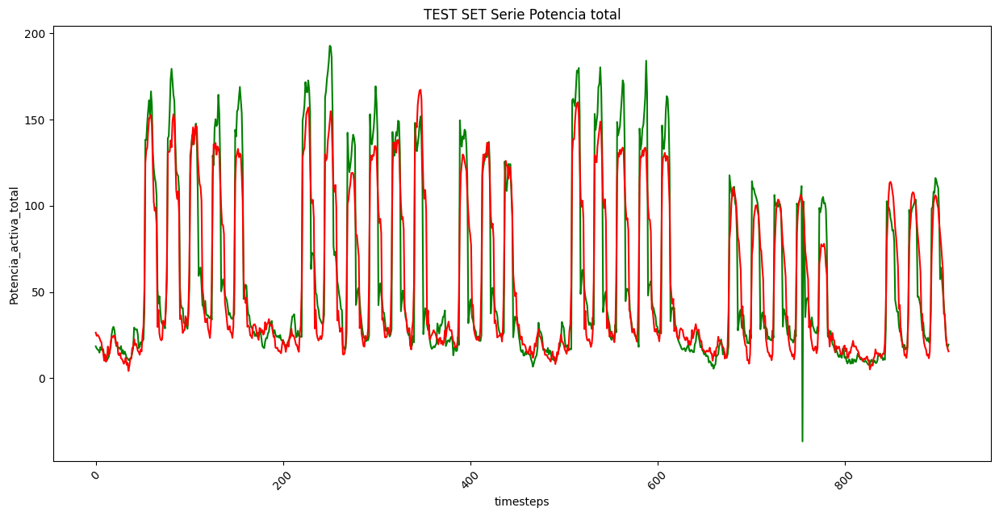

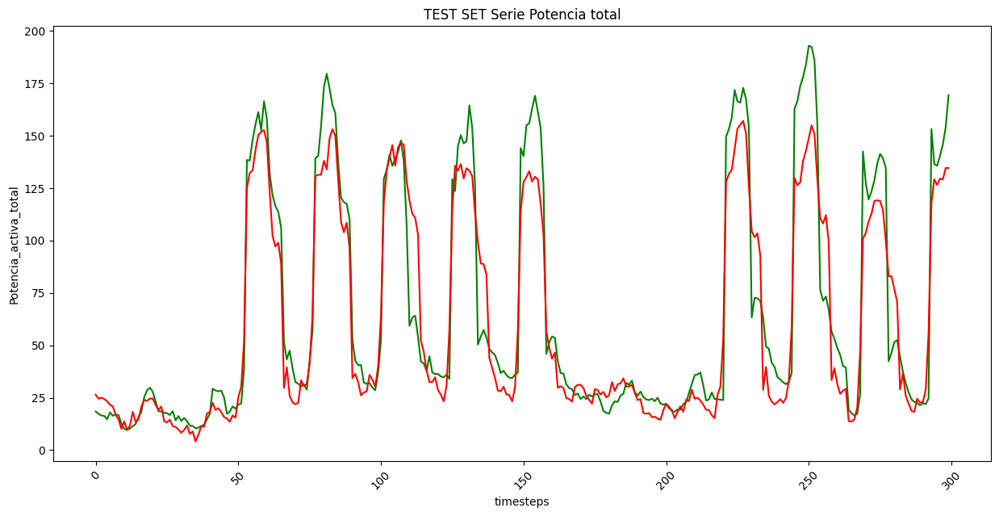

Resultado Error Medio de Validacion en los 6 Folds: 0.06199882489939531
[0.09939048439264297, 0.061769016087055206, 0.350932776927948, 0.05383181571960449, 0.17664995789527893, 0.15831111371517181]
Resultado Error Medio de Test en los 6 Folds: 0.15014752745628357


,Test mean Error,ES_LABORABLE,DIA_SEMANA,MES,SOLO_POTENCIA_TOTAL,VARIABLES_DIA_ANTERIOR,TEMPERATURAS,FOLDS,SHUFFLE_TRAIN_VAL_DAYS,INPUT_DAYS,OVERSAMPLING
0,0.154766,True,True,True,True,True,True,6,True,1,True
1,0.141868,True,True,True,True,True,True,6,True,1,True
2,0.165026,True,True,True,True,False,True,6,True,1,True
3,0.149221,True,True,True,True,False,True,6,True,1,True
4,0.428102,False,True,True,True,True,True,6,True,1,True
5,0.131401,True,True,True,True,True,True,6,True,1,False
6,0.126771,True,True,True,False,True,True,6,True,1,False
7,0.133637,True,True,True,False,True,True,6,True,1,False
8,0.131685,True,True,True,False,True,False,6,True,1,False
9,0.132714,True,True,True,False,True,False,6,True,1,False


In [ ]:
# Este codigo es posterior a lo que viene debajo.  Una vez elegí la arquitectura mejor con los datos que tenía, usando el Keras_tuner,  Hice estos estudios de "Ablación" 
#   para identificar las features que realmente eran utiles.   Aqui se entrena un modelo de la arquitectura elegida con el dataset de prueba, y se alamacenan los resultados y las 
# características del dataset en un csv que se muestra como un dataframe, decara a tomar decisiones

# Los experimentos con histórico de Prediciones del municipio por AEMET no se pudieron realizar ya que no se podía consultar dicho histórico.
# Por tanto se uso de prueba unos históricos muy pobres de Observaciones con temp max min y media...  En la implementacion se ha metido las predicciones de aemet con mas informacion por tramos de horas etc.
# Por considerarse tambien necesario para el futuro modelo de generación fotovoltaica, se implementó un script para ir solicitando y almacenando predicciones en el servidor de jupyter 
# https://192.168.8.30:8000/user/inaki.campo/tree/Brain_AEMET
# En este directorio hay una carpeta que contiene todas las predicciones de aemet. Hay un csv por cada municipio de España. El nombre del CSV hace referencia a su código segun AEMET.
# En este directorio hay un csv con el codigo y nombre de cada municipio, llamado id_municipios.csv

# Primero creo dataset con N features
train_folds, val_folds, test_folds  = get_folds(X_seq, X_condition, y, SHUFFLE_TRAIN_VAL_DAYS, indices_festivos)
test_losses = []
val_losses = []

for train_fold, val_fold, test_fold in zip(train_folds, val_folds, test_folds):
    train, val, test, INPUT_1_SHAPE = get_dataset(train_fold, val_fold, test_fold)
    print(variables_condicionales)

    # Uno de las arquitecturas seleccionadas, para testear diferentes inputs
    # conv-lstm-conditional	2	0.2	700	1200	3	3	600
    input1 = tf.keras.Input(shape=INPUT_1_SHAPE)
    input2 = tf.keras.Input(shape=(variables_condicionales,))
    x = Conv1D(filters=1200, kernel_size=3, strides=3, padding="causal", activation="relu", input_shape=INPUT_1_SHAPE)(input1)
    x = ConditionalRecurrent(LSTM( 900, input_shape=INPUT_1_SHAPE, activation='tanh', return_sequences=True))([x, input2])
    x = LSTM(1100, activation='tanh')(x)
    x = Dropout(0.1)(x)
    output = Dense(24)(x)
            
    modelo_test_inputs = Model(inputs=[input1, input2], outputs=output)
    modelo_test_inputs.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mse')

    # Creamos callbacks
    LR_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=9)
    save_best_epoch = tf.keras.callbacks.ModelCheckpoint(filepath='./modelo_test_inputs.h5', save_best_only=True, monitor='val_loss', mode='min')

    # Entreno el modelo, Cargo el epoch con mejor fit a validación y lo guardo para cada Fold
    history = modelo_test_inputs.fit(x=train, validation_data=val, epochs=100, batch_size=BATCH_SIZE, callbacks=[LR_scheduler, save_best_epoch], verbose=1)

    # Evaluamos con test y anotamos los resultados
    modelo_test_inputs = tf.keras.models.load_model('./modelo_test_inputs.h5', custom_objects={'ConditionalRecurrent':ConditionalRecurrent})
    test_loss = modelo_test_inputs.evaluate(test, verbose=0)
    test_losses.append(test_loss)
    val_losses.append(modelo_test_inputs.evaluate(val, verbose=0))
    print(f'Validation_error: {modelo_test_inputs.evaluate(val, verbose=0):.3f}')
    print(f'test_error: {test_loss:.3f}')


# Pinto resultados ultimo fold
predicciones_escaladas = modelo_test_inputs.predict(test, verbose=0).reshape(-1)
valores_reales_escalados = np.concatenate([y for x, y in test], axis=0).reshape(-1)
#   A continuacion restamos multiplicamos a cada valor por la desviación tipica de consumos y le sumamos la media
valores_reales = valores_reales_escalados*desviacion_tipica + media
predicciones = predicciones_escaladas*desviacion_tipica + media
pintar_predicciones(valores_reales, predicciones)



print(f'Resultado Error Medio de Validacion en los {FOLDS} Folds: {np.mean(val_losses)}')
print(test_losses)
print(f'Resultado Error Medio de Test en los {FOLDS} Folds: {np.mean(test_losses)}')
# guradamos un pandas con los parametros


if 'dataset_inputs.csv' not in os.listdir():
    dataset_inputs = pd.DataFrame(columns=['Test mean Error', 'ES_LABORABLE', 'DIA_SEMANA', 'MES', 'SOLO_POTENCIA_TOTAL','VARIABLES_DIA_ANTERIOR', 'TEMPERATURAS', 'FOLDS', 'SHUFFLE_TRAIN_VAL_DAYS', 'INPUT_DAYS', 'OVERSAMPLING'])
    dataset_inputs.to_csv('./dataset_inputs.csv', index=False)

dataset_inputs = pd.read_csv('./dataset_inputs.csv')
list_row = [np.mean(test_losses), ES_LABORABLE, DIA_SEMANA, MES, SOLO_POTENCIA_TOTAL, VARIABLES_DIA_ANTERIOR, TEMPERATURAS, FOLDS, SHUFFLE_TRAIN_VAL_DAYS, INPUT_DAYS, OVERSAMPLING]
dataset_inputs.loc[len(dataset_inputs)] = list_row
dataset_inputs.to_csv('./dataset_inputs.csv', index=False)
display(dataset_inputs)


In [19]:
# Esto es para ver el csv si no se quiere experimentar ninguna conf nueva
dataset_inputs = pd.read_csv('./dataset_inputs.csv')
display(dataset_inputs)

,Test mean Error,ES_LABORABLE,DIA_SEMANA,MES,SOLO_POTENCIA_TOTAL,VARIABLES_DIA_ANTERIOR,TEMPERATURAS,FOLDS,SHUFFLE_TRAIN_VAL_DAYS,INPUT_DAYS,OVERSAMPLING
0,0.154766,True,True,True,True,True,True,6,True,1,True
1,0.141868,True,True,True,True,True,True,6,True,1,True
2,0.165026,True,True,True,True,False,True,6,True,1,True
3,0.149221,True,True,True,True,False,True,6,True,1,True
4,0.428102,False,True,True,True,True,True,6,True,1,True
5,0.131401,True,True,True,True,True,True,6,True,1,False
6,0.126771,True,True,True,False,True,True,6,True,1,False
7,0.133637,True,True,True,False,True,True,6,True,1,False
8,0.131685,True,True,True,False,True,False,6,True,1,False
9,0.132714,True,True,True,False,True,False,6,True,1,False


In [28]:
"""
if 'dataset_inputs.csv' not in os.listdir():
    dataset_inputs = pd.DataFrame(columns=['Test mean Error', 'ES_LABORABLE', 'DIA_SEMANA', 'MES', 'SOLO_POTENCIA_TOTAL','VARIABLES_DIA_ANTERIOR', 'TEMPERATURAS', 'FOLDS', 'SHUFFLE_TRAIN_VAL_DAYS', 'INPUT_DAYS', 'OVERSAMPLING'])
    display(dataset_inputs)
    dataset_inputs.to_csv('./dataset_inputs.csv', index=False)

dataset_inputs = pd.read_csv('./dataset_inputs.csv')
list_row = [np.mean(test_losses), ES_LABORABLE, DIA_SEMANA, MES, SOLO_POTENCIA_TOTAL, VARIABLES_DIA_ANTERIOR, TEMPERATURAS, FOLDS, SHUFFLE_TRAIN_VAL_DAYS, INPUT_DAYS, OVERSAMPLING]
print(list_row)
dataset_inputs.loc[len(dataset_inputs)] = list_row
dataset_inputs.to_csv('./dataset_inputs.csv', index=False)
display(dataset_inputs)
"""

"\nif 'dataset_inputs.csv' not in os.listdir():\n    dataset_inputs = pd.DataFrame(columns=['Test mean Error', 'ES_LABORABLE', 'DIA_SEMANA', 'MES', 'SOLO_POTENCIA_TOTAL','VARIABLES_DIA_ANTERIOR', 'TEMPERATURAS', 'FOLDS', 'SHUFFLE_TRAIN_VAL_DAYS', 'INPUT_DAYS', 'OVERSAMPLING'])\n    display(dataset_inputs)\n    dataset_inputs.to_csv('./dataset_inputs.csv', index=False)\n\ndataset_inputs = pd.read_csv('./dataset_inputs.csv')\nlist_row = [np.mean(test_losses), ES_LABORABLE, DIA_SEMANA, MES, SOLO_POTENCIA_TOTAL, VARIABLES_DIA_ANTERIOR, TEMPERATURAS, FOLDS, SHUFFLE_TRAIN_VAL_DAYS, INPUT_DAYS, OVERSAMPLING]\nprint(list_row)\ndataset_inputs.loc[len(dataset_inputs)] = list_row\ndataset_inputs.to_csv('./dataset_inputs.csv', index=False)\ndisplay(dataset_inputs)\n"

### Tuner búsqueda de arquitectura

In [29]:
# Aqui se configuró un espacio de busqueda de hiperparámetros y arquitecturas.  PAra ello usamos la librería Keras_tuner

# Finalmente la ARQ elegida fue la última, a la que llamo "conv-lstm-conditional"


def create_model(hp):
    global INPUT_1_SHAPE
    global variables_condicionales
    
    
    input1 = tf.keras.Input(shape=INPUT_1_SHAPE)
    input2 = tf.keras.Input(shape=(variables_condicionales,))
    OPTIMIZER = 'adam'
    ACTIVATION = 'tanh'

    # ['vector-output-conditional', 'vector-output-after', 'encoder-decoder', 'encoder-decoder-conditional', 'conv-lstm-conditional']
    ARCHITECTURE = hp.Choice("Architecture", ['conv-lstm-conditional'])     #  
    LSTM_LAYERS = hp.Int("Num_Layers", min_value=1 , max_value=2 , step=1)   # Capas de lstm que vamos a stackear
    DROPOUT_RATE = hp.Float("Dropout_rate", min_value=0.0, max_value=0.3, step=0.10)
    HIDDEN_UNITS_1 = hp.Int("hidden_units_1", min_value=300 , max_value=1000 , step=100)
    
    
    #LR = hp.Float("lr", min_value=1e-4, max_value=1e-2, sampling="log")

    
    
    if ARCHITECTURE == 'encoder-decoder-conditional':
        
        # ENCODER (tradicionalmente lstm vanilla)
        if LSTM_LAYERS == 1:
            x1 = ConditionalRecurrent(LSTM( HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION))([input1, input2])
        
        # Si LSTM_LAYERS es mayor que uno no sera vanilla y Stackeamos tantas capas como este definido
        elif LSTM_LAYERS==2:
            HIDDEN_UNITS_2 = hp.Int("hidden_units_2", min_value=200 , max_value=1000 , step=100)
            x1 = ConditionalRecurrent(LSTM( HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION, return_sequences=True))([input1, input2])
            x1 = LSTM( HIDDEN_UNITS_2, activation=ACTIVATION)(x1)
                      
        else:
            HIDDEN_UNITS_2 = hp.Int("hidden_units_2", min_value=200 , max_value=1000 , step=100)
            x1 = ConditionalRecurrent(LSTM( HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION, return_sequences=True))([input1, input2])
            for count in range(LSTM_LAYERS - 2):
                x1 = LSTM( HIDDEN_UNITS_2, activation=ACTIVATION, return_sequences=True)(x1)
            x1 = LSTM( HIDDEN_UNITS_2, activation=ACTIVATION)(x1)

        # Repetimos la salida de encoder tantas veces como timesteps de salida (24 h)
        x1 = RepeatVector(24)(x1)

        # Decoder
        x1 = LSTM(HIDDEN_UNITS_1, activation=ACTIVATION, return_sequences=True)(x1)
        
        # Dropout
        x1 = Dropout(DROPOUT_RATE)(x1)
        
        #   Se realiza la prediccion de cada timestep
        output = TimeDistributed(Dense(1))(x1)
        
        
    if ARCHITECTURE == 'encoder-decoder':
        
        # ENCODER (tradicionalmente lstm vanilla)
        if LSTM_LAYERS == 1:
            x1 = LSTM( HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION)(input1)
        
        # Si LSTM_LAYERS es mayor que uno no sera vanilla y Stackeamos tantas capas como este definido
        elif LSTM_LAYERS==2:
            HIDDEN_UNITS_2 = hp.Int("hidden_units_2", min_value=200 , max_value=1000 , step=100)
            x1 = LSTM( HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION, return_sequences=True)(input1)
            x1 = LSTM( HIDDEN_UNITS_2, activation=ACTIVATION)(x1)
                      
        else:
            HIDDEN_UNITS_2 = hp.Int("hidden_units_2", min_value=200 , max_value=1000 , step=100)
            x1 = LSTM( HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION, return_sequences=True)(input1)
            for count in range(LSTM_LAYERS - 2):
                x1 = LSTM( HIDDEN_UNITS_2, activation=ACTIVATION, return_sequences=True)(x1)
            x1 = LSTM( HIDDEN_UNITS_2, activation=ACTIVATION)(x1)

        # Repetimos la salida de encoder tantas veces como timesteps de salida (24 h)
        x1 = RepeatVector(24)(x1)

        # Decoder
        x1 = LSTM(HIDDEN_UNITS_1, activation=ACTIVATION, return_sequences=True)(x1)
        
        # Dropout
        x1 = Dropout(DROPOUT_RATE)(x1)
        
        # Vector de salida con variables concatenadas
        #concatenated = tf.keras.layers.Concatenate()([x1, input2])
        
        #   Se realiza la prediccion de cada timestep
        output = TimeDistributed(Dense(1))(concatenated)
        
                      
        
    if ARCHITECTURE == 'vector-output-conditional':
                
        # Input LSTM
        if LSTM_LAYERS == 1:
            x2 = ConditionalRecurrent(LSTM(HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION))([input1, input2])
        
        # Stackeamos tantas capas extra como este definido en LSTM_LAYERS
        elif LSTM_LAYERS==2:
            HIDDEN_UNITS_2 = hp.Int("hidden_units_2", min_value=200 , max_value=1000 , step=100)
            x2 = ConditionalRecurrent(LSTM( HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION, return_sequences=True))([input1, input2])
            x2 = LSTM( HIDDEN_UNITS_2, activation=ACTIVATION)(x2)
        
        else:
            HIDDEN_UNITS_2 = hp.Int("hidden_units_2", min_value=200 , max_value=1000 , step=100)
            x2 = ConditionalRecurrent(LSTM( HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION, return_sequences=True))([input1, input2])
            for count in range(LSTM_LAYERS - 2):
                x2 = LSTM( HIDDEN_UNITS_2, activation=ACTIVATION, return_sequences=True)(x2)
            x2 = LSTM( HIDDEN_UNITS_2, activation=ACTIVATION)(x2)

        x2 = Dropout(DROPOUT_RATE)(x2)
        # Vector de salida
        output = Dense(24)(x2)
        
    
    if ARCHITECTURE == 'vector-output-after':
                
        # Input LSTM
        if LSTM_LAYERS == 1:
            x2 = LSTM(HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION)(input1)
        
        # Stackeamos tantas capas extra como este definido en LSTM_LAYERS
        elif LSTM_LAYERS==2:
            HIDDEN_UNITS_2 = hp.Int("hidden_units_2", min_value=200 , max_value=1000 , step=100)
            x2 = LSTM( HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION, return_sequences=True)(input1)
            x2 = LSTM( HIDDEN_UNITS_2, activation=ACTIVATION)(x2)
        
        else:
            HIDDEN_UNITS_2 = hp.Int("hidden_units_2", min_value=200 , max_value=1000 , step=100)
            x2 = LSTM( HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION, return_sequences=True)(input1)
            for count in range(LSTM_LAYERS - 2):
                x2 = LSTM( HIDDEN_UNITS_2, activation=ACTIVATION, return_sequences=True)(x2)
            x2 = LSTM( HIDDEN_UNITS_2, activation=ACTIVATION)(x2)

        x2 = Dropout(DROPOUT_RATE)(x2)
            
        # Vector de salida con variables concatenadas
        concatenated = tf.keras.layers.Concatenate()([x2, input2])
        output = Dense(24)(concatenated)
    
    
        
    
    if ARCHITECTURE == 'conv-lstm-conditional':
        FILTERS = hp.Int("Filters", min_value=400, max_value=1500, step=200)
        KERNEL_SIZE = hp.Int("Kernel_size", min_value=3, max_value=7, step=2)
        STRIDES = hp.Int("Strides", min_value=1, max_value=7, step=2)
        
        x3 = Conv1D(filters=FILTERS, kernel_size=KERNEL_SIZE, strides=STRIDES, padding="causal", activation="relu", input_shape=INPUT_1_SHAPE)(input1)
        
        # Input LSTM
        if LSTM_LAYERS == 1:
            x3 = ConditionalRecurrent(LSTM( HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION))([x3, input2])
        
        # Stackeamos tantas capas extra como este definido en LSTM_LAYERS
        elif LSTM_LAYERS == 2:
            HIDDEN_UNITS_2 = hp.Int("hidden_units_2", min_value=300 , max_value=1000 , step=100)
            x3 = ConditionalRecurrent(LSTM( HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION, return_sequences=True))([x3, input2])
            x3 = LSTM( HIDDEN_UNITS_2, activation=ACTIVATION)(x3)
        
        else:
            HIDDEN_UNITS_2 = hp.Int("hidden_units_2", min_value=300 , max_value=900 , step=100)
            x3 = ConditionalRecurrent(LSTM( HIDDEN_UNITS_1, input_shape=INPUT_1_SHAPE, activation=ACTIVATION, return_sequences=True))([x3, input2])
            for count in range(LSTM_LAYERS - 2):
                x3 = LSTM( HIDDEN_UNITS_2, activation=ACTIVATION, return_sequences=True)(x3)
            x3 = LSTM(HIDDEN_UNITS_2, activation=ACTIVATION)(x3)
            
        
        x3 = Dropout(DROPOUT_RATE)(x3)
            
        # Vector de salida
        output = Dense(24)(x3)
        
    model = Model(inputs=[input1, input2], outputs=output)
    
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mse')
    
    return model

    
    
    
# Dimensiones esperadas = [samples, timesteps, features]



# Modelos a Probar:    https://machinelearningmastery.com/how-to-develop-lstm-models-for-time-series-forecasting/
#  varieties of LSTMs:
#      Vanilla
#      Stacked
#      CNN (subsecuencias)
#      ConvLSTM

### Experimentos de búsqueda automática

In [32]:
# En este código se explora ese espacio de busqueda de arquitrectura y parámetros.
# En este caso no aplico cross val para este trozo por tiempo de ejecución
# Se realizan 2 o mas veces cada experimento para redicir el efdecto de la varianza dado por el estado inicial de los pesos, en nuestra elección

train_folds, val_folds, test_folds = get_folds(X_seq, X_condition, y, SHUFFLE_TRAIN_VAL_DAYS, indices_festivos)
train, val, test, INPUT_1_SHAPE  = get_dataset(train_folds[0], val_folds[0], test_folds[0])


tuner = kt.RandomSearch(
    hypermodel=create_model,
    objective="val_loss",
    max_trials=50,
    executions_per_trial=2,
    overwrite=True,
    directory="./",
    project_name="arquitecturas",
)

LR_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=6)
stop_early = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=14)

Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)


In [33]:
tuner.search(train, epochs=100, validation_data=val, callbacks=[stop_early, LR_scheduler])

Trial 50 Complete [00h 00m 38s]
val_loss: 0.05057322233915329

Best val_loss So Far: 0.03859615884721279
Total elapsed time: 05h 31m 14s
INFO:tensorflow:Oracle triggered exit


In [36]:
# Obtengo las mejores 10 configuraciones de parametros y las guardo para evaluarlas con cross-validation y quedarme con la mejor
# sobreescribe fichero
best_hps=tuner.get_best_hyperparameters(num_trials=10)
file = open('best_hps' ,'wb')
pickle.dump(best_hps, file)
file.close()

resultados = [x.values for x in best_hps]
df = pd.DataFrame(resultados)
display(df)



,Architecture,Num_Layers,Dropout_rate,hidden_units_1,Filters,Kernel_size,Strides,hidden_units_2
0,conv-lstm-conditional,3,0.1,500,1200,5,5,400
1,conv-lstm-conditional,2,0.2,700,1200,3,3,600
2,conv-lstm-conditional,3,0.1,600,1000,7,3,700
3,conv-lstm-conditional,1,0.0,700,1000,5,3,900
4,conv-lstm-conditional,3,0.0,400,1400,5,5,300
5,conv-lstm-conditional,3,0.1,900,1000,7,3,500
6,conv-lstm-conditional,3,0.0,700,600,5,3,700
7,conv-lstm-conditional,1,0.2,900,1200,5,3,500
8,conv-lstm-conditional,2,0.0,500,400,5,3,800
9,conv-lstm-conditional,3,0.1,800,600,5,3,400


In [37]:
#Este código es solo para leer el fichero si no se quiere realiza una busqueda en profundidad y sobreescribir

file = open('best_hps' ,'rb')
best_hps_loaded = pickle.load(file)
file.close()

resultados = [x.values for x in best_hps_loaded]
df = pd.DataFrame(resultados)
display(df)

,Architecture,Num_Layers,Dropout_rate,hidden_units_1,Filters,Kernel_size,Strides,hidden_units_2
0,conv-lstm-conditional,3,0.1,500,1200,5,5,400
1,conv-lstm-conditional,2,0.2,700,1200,3,3,600
2,conv-lstm-conditional,3,0.1,600,1000,7,3,700
3,conv-lstm-conditional,1,0.0,700,1000,5,3,900
4,conv-lstm-conditional,3,0.0,400,1400,5,5,300
5,conv-lstm-conditional,3,0.1,900,1000,7,3,500
6,conv-lstm-conditional,3,0.0,700,600,5,3,700
7,conv-lstm-conditional,1,0.2,900,1200,5,3,500
8,conv-lstm-conditional,2,0.0,500,400,5,3,800
9,conv-lstm-conditional,3,0.1,800,600,5,3,400


#### Evaluamos los mejores resultados con cross-validation

-----------------------MODEL 1-----------------------------
--MODEL 1-- FOLD 1
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.038
test_error: 0.119
MAPE fold_1 desescalado: 24.37%


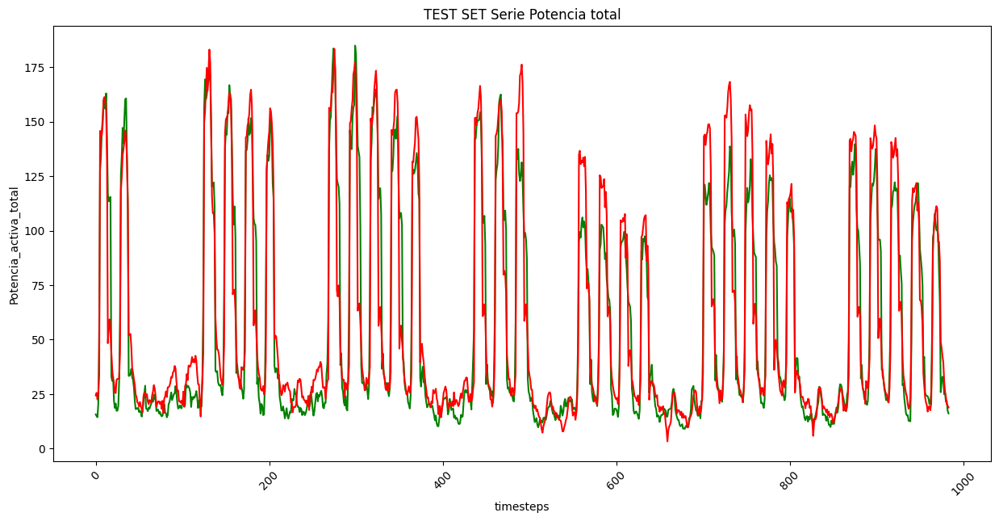

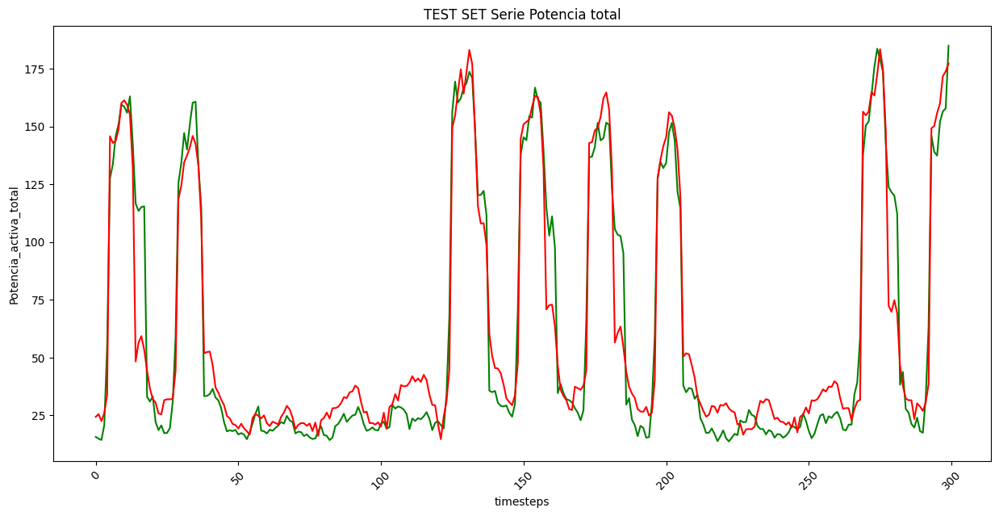

--MODEL 1-- FOLD 2
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.115
test_error: 0.057
MAPE fold_2 desescalado: 20.64%


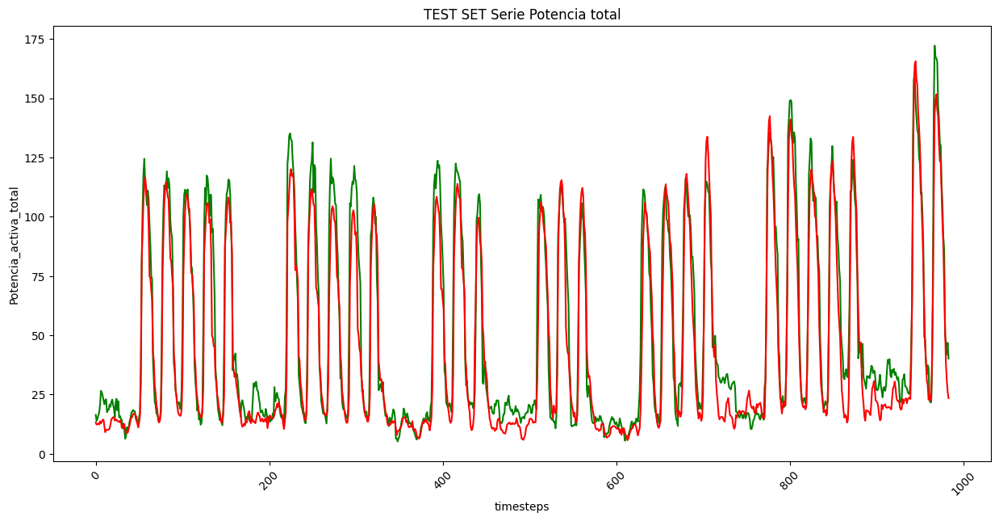

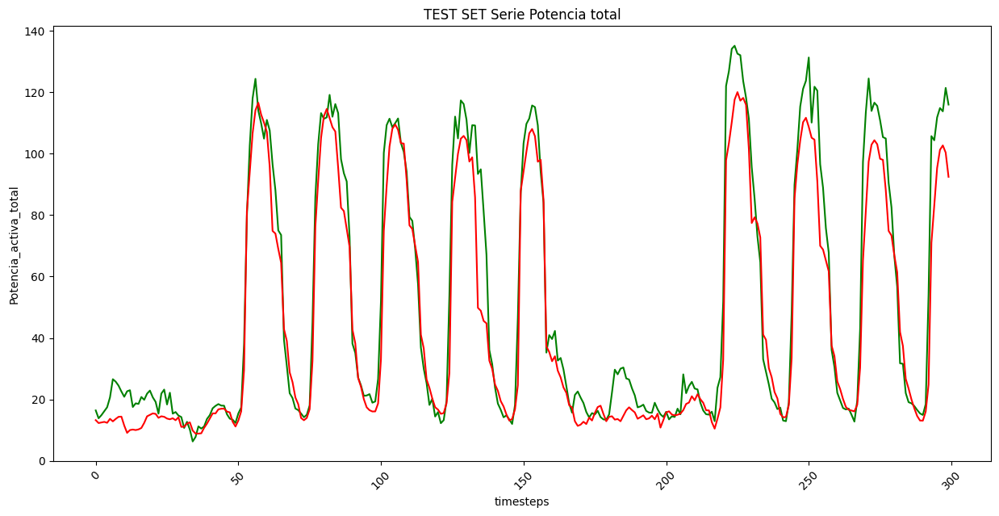

--MODEL 1-- FOLD 3
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.060
test_error: 0.347
MAPE fold_3 desescalado: 34.68%


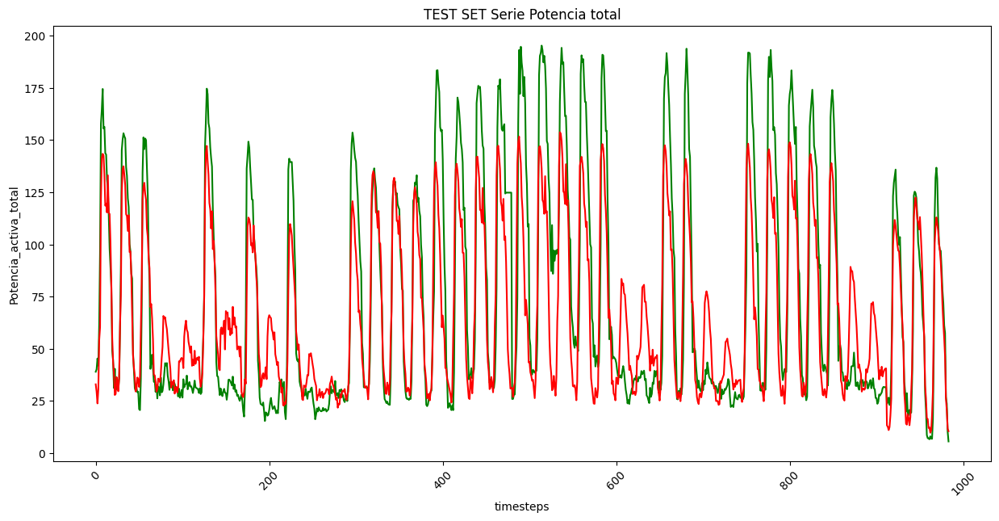

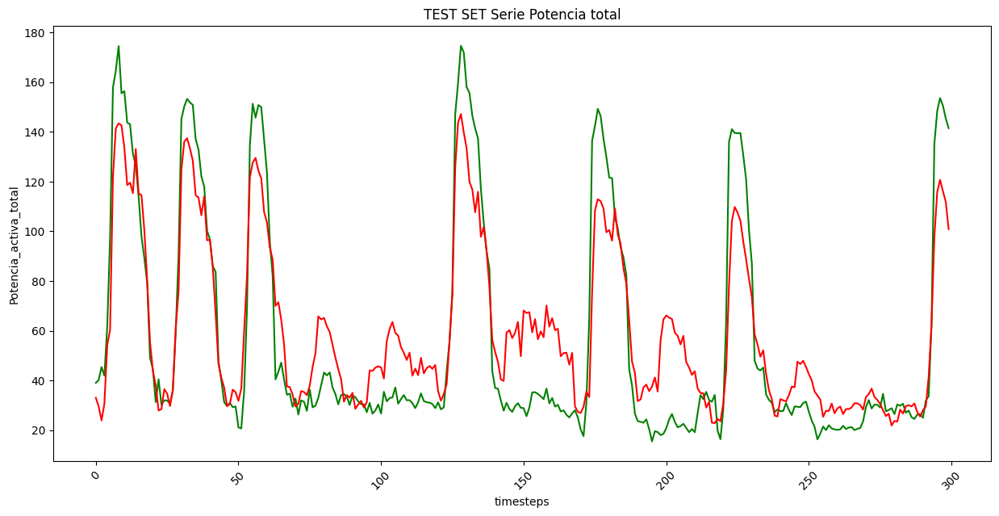

--MODEL 1-- FOLD 4
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.108
test_error: 0.043
MAPE fold_4 desescalado: 76.43%


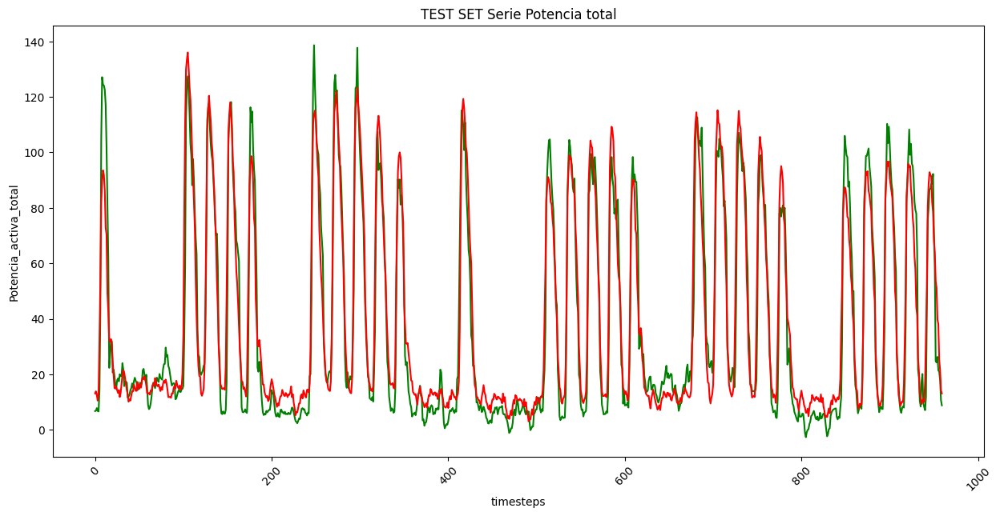

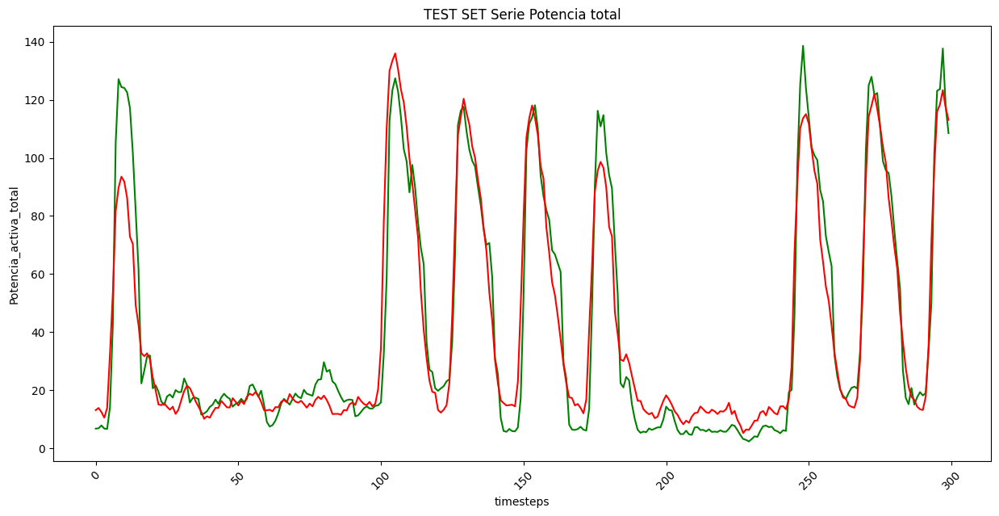

--MODEL 1-- FOLD 5
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.063
test_error: 0.111
MAPE fold_5 desescalado: 50.04%


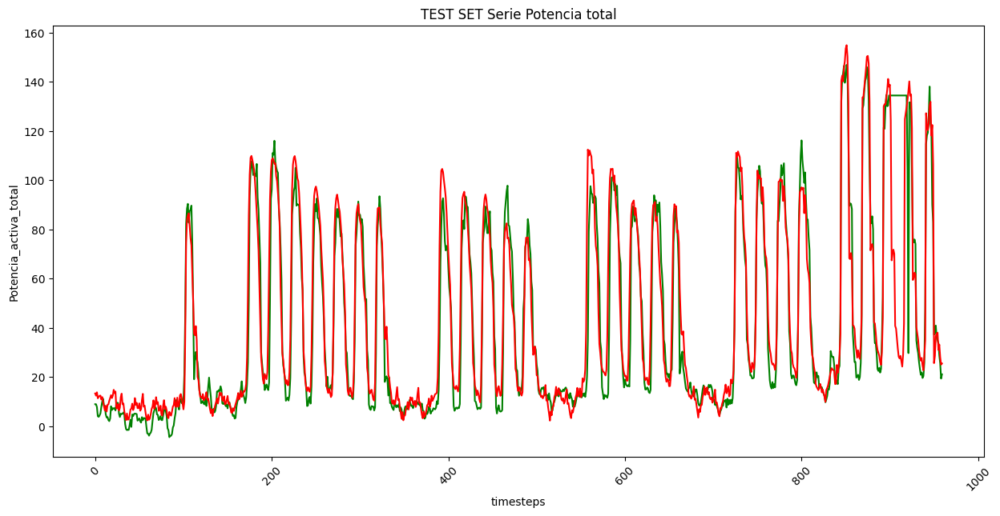

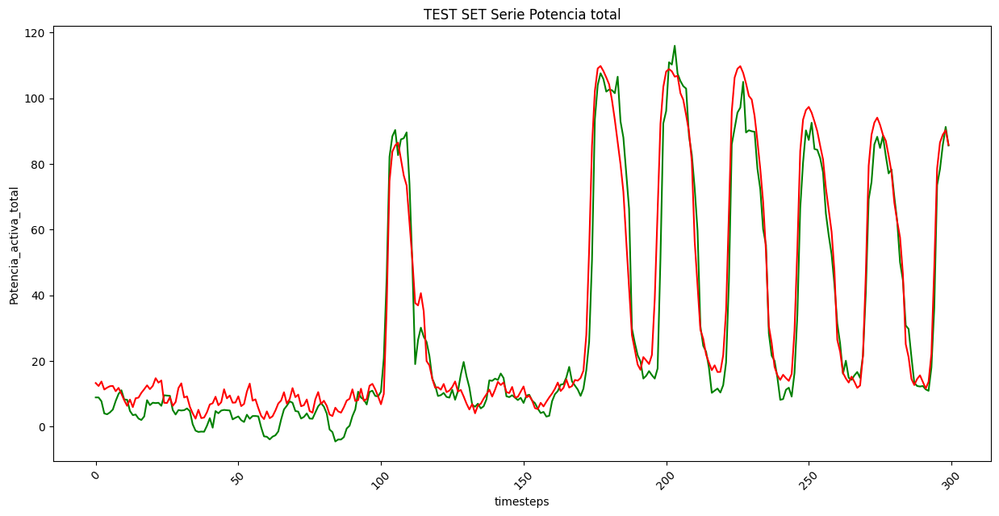

--MODEL 1-- FOLD 6
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.075
test_error: 0.151
MAPE fold_6 desescalado: 30.01%


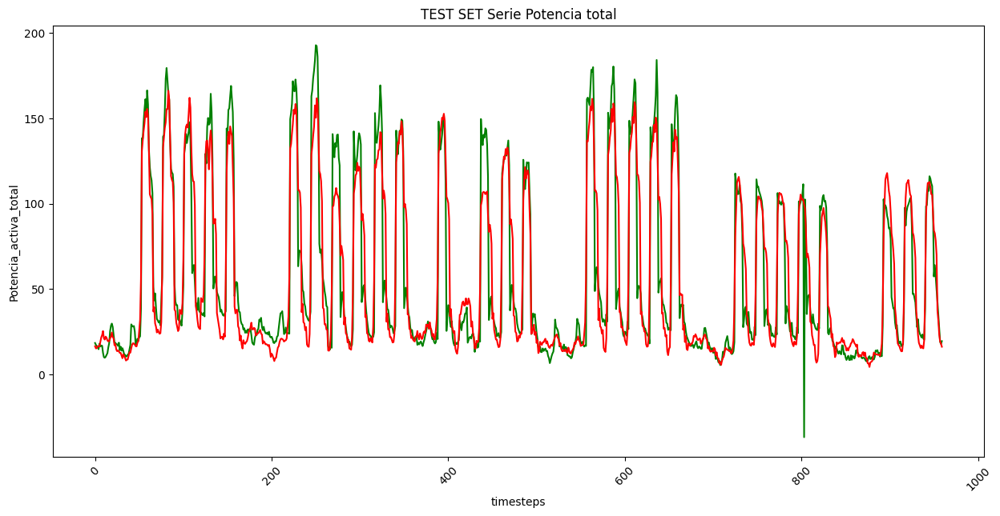

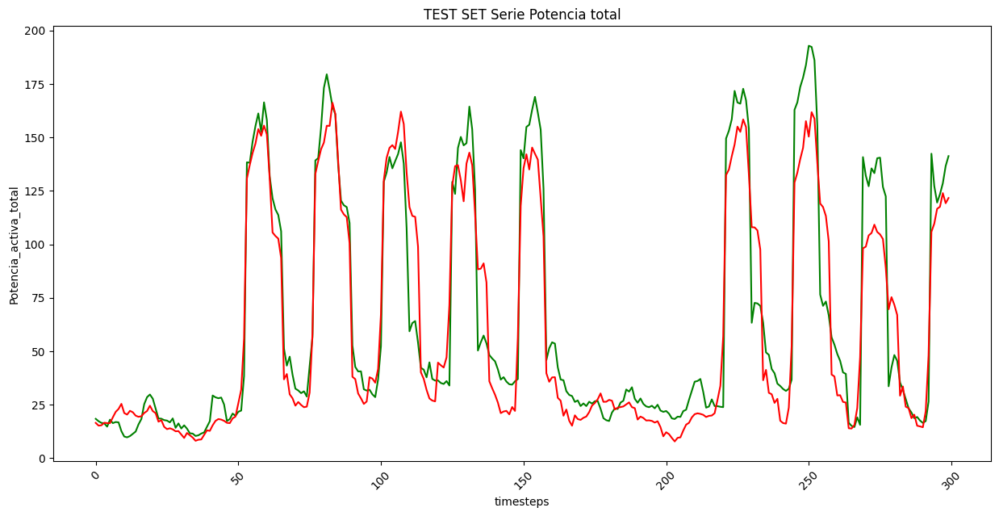


 Mean Validation error of all folds: 0.0767

 Mean Test error of all folds: 0.1380
-----------------------MODEL 2-----------------------------
--MODEL 2-- FOLD 1
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.040
test_error: 0.144
MAPE fold_1 desescalado: 31.98%


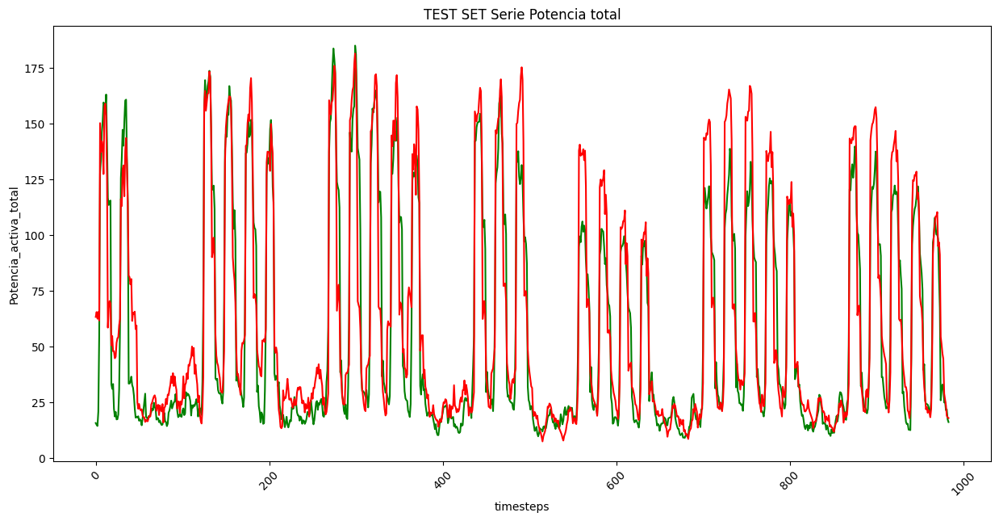

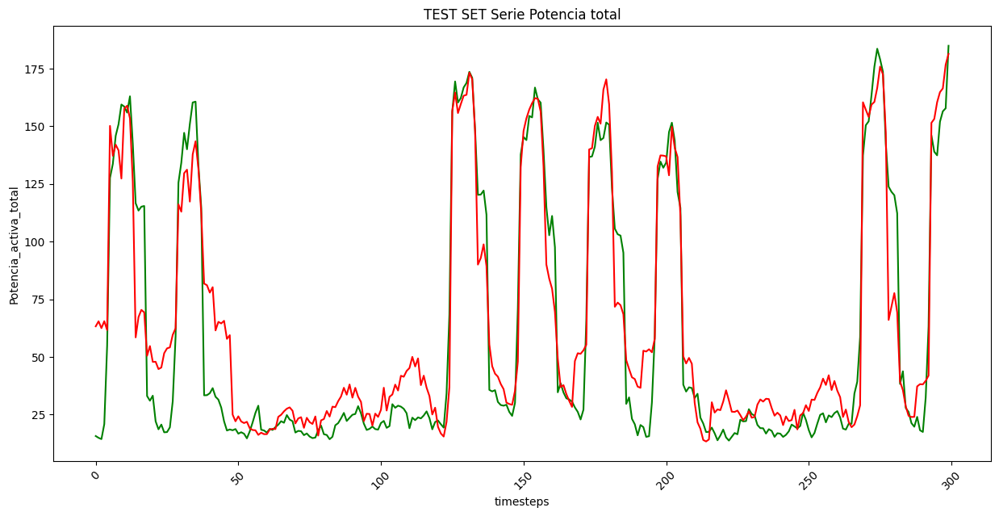

--MODEL 2-- FOLD 2
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.108
test_error: 0.054
MAPE fold_2 desescalado: 21.58%


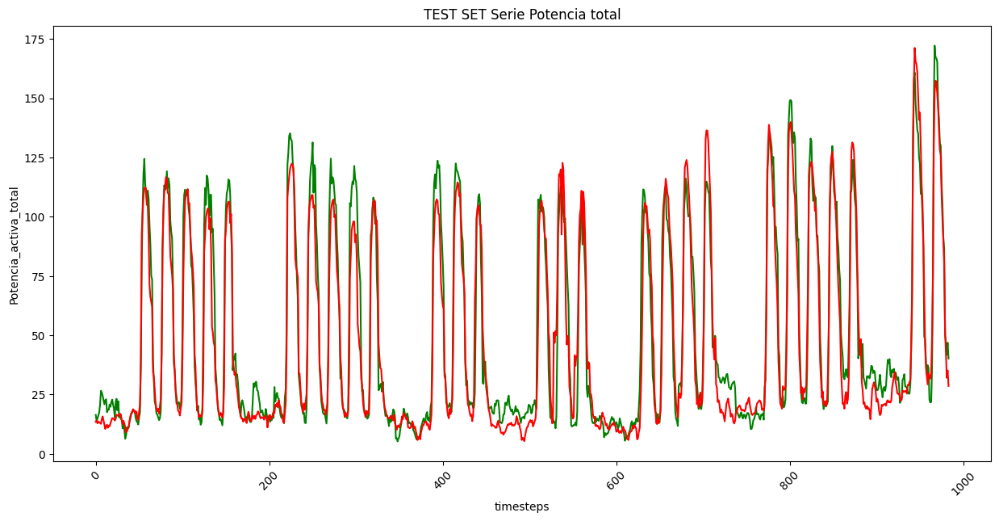

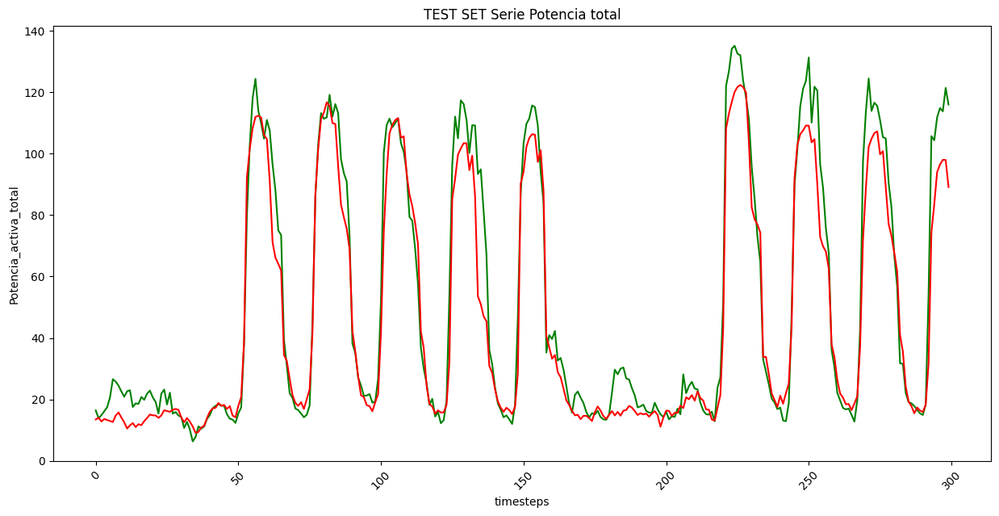

--MODEL 2-- FOLD 3
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.058
test_error: 0.369
MAPE fold_3 desescalado: 32.23%


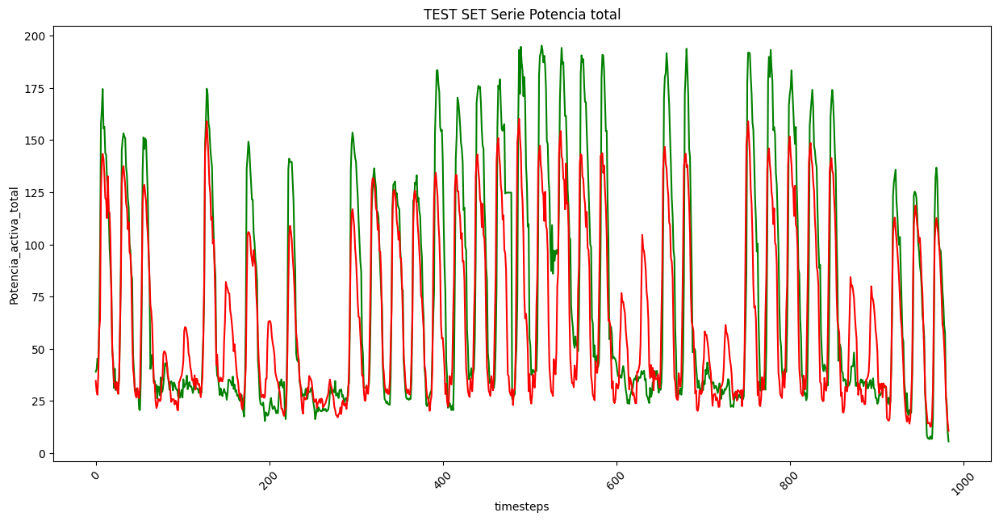

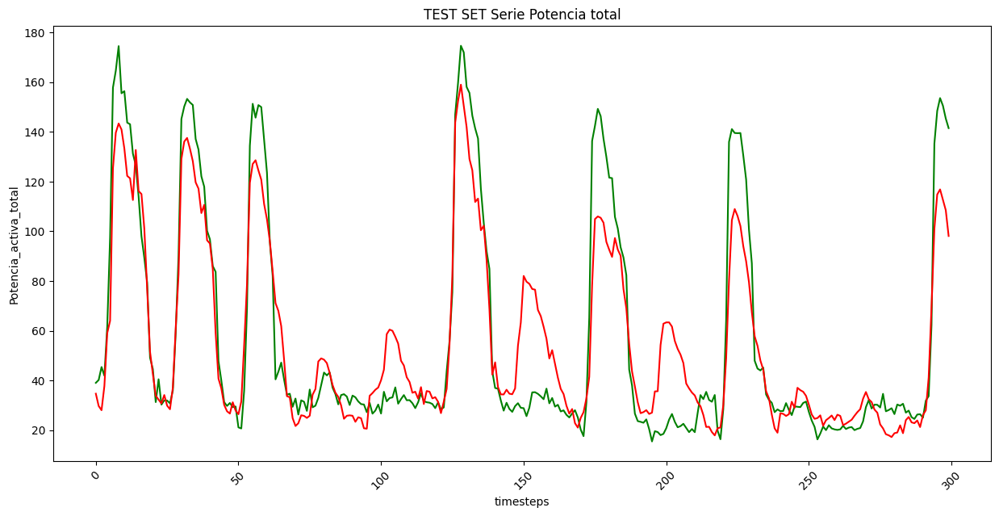

--MODEL 2-- FOLD 4
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.123
test_error: 0.058
MAPE fold_4 desescalado: 113.92%


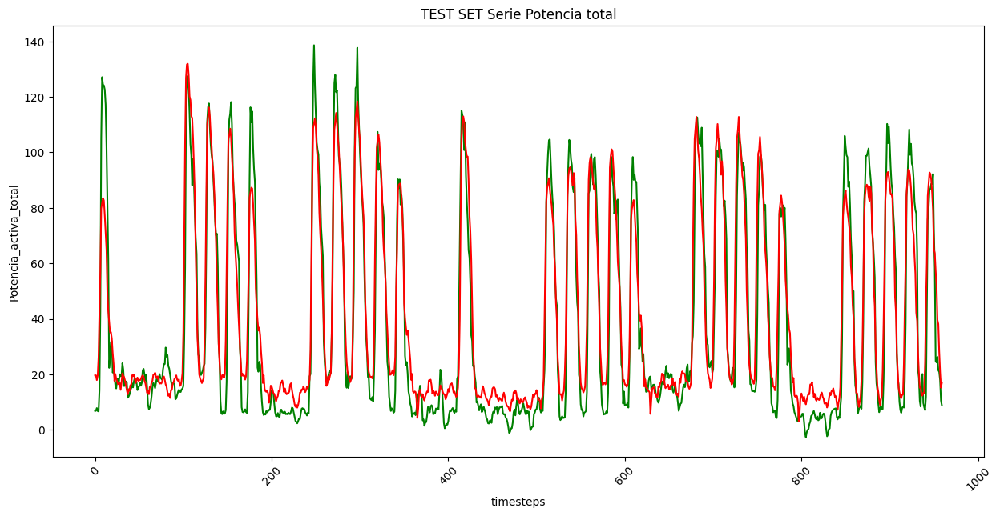

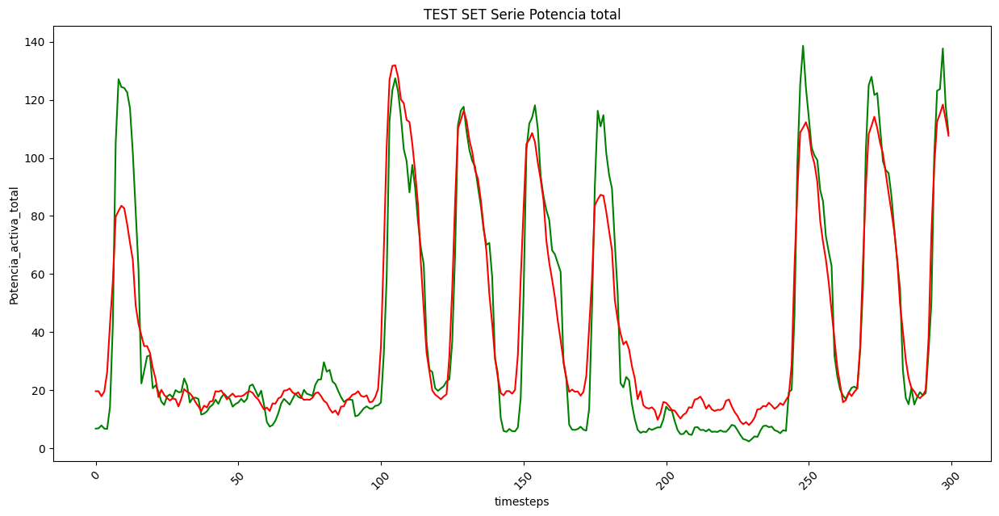

--MODEL 2-- FOLD 5
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.063
test_error: 0.118
MAPE fold_5 desescalado: 53.77%


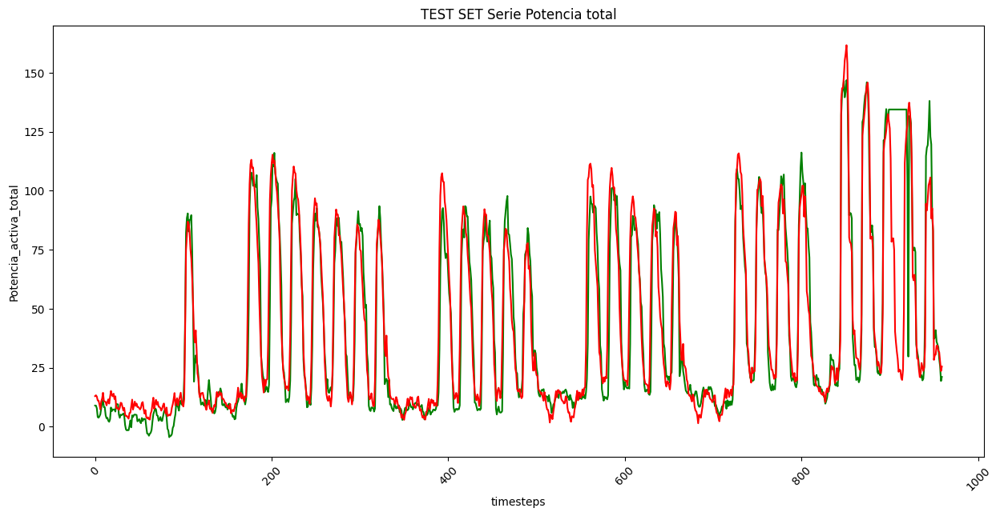

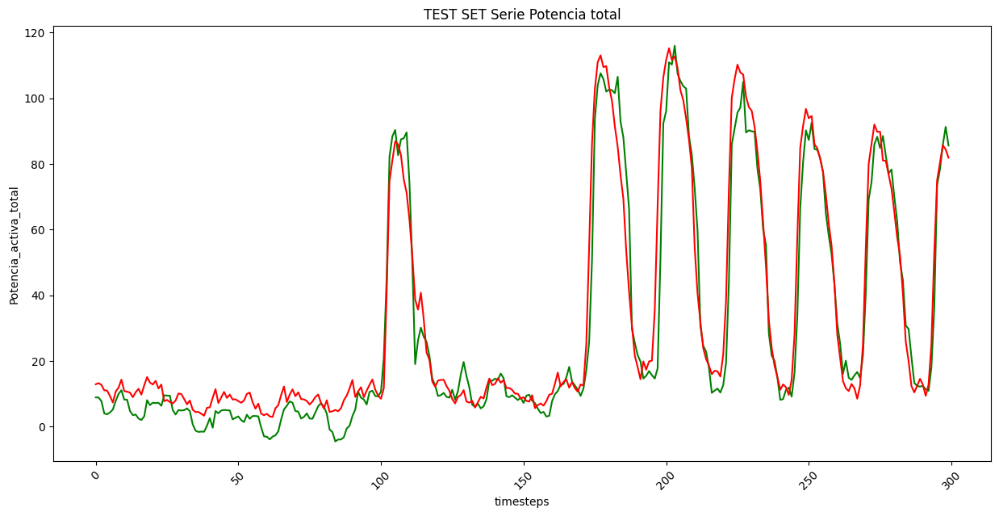

--MODEL 2-- FOLD 6
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.088
test_error: 0.157
MAPE fold_6 desescalado: 29.94%


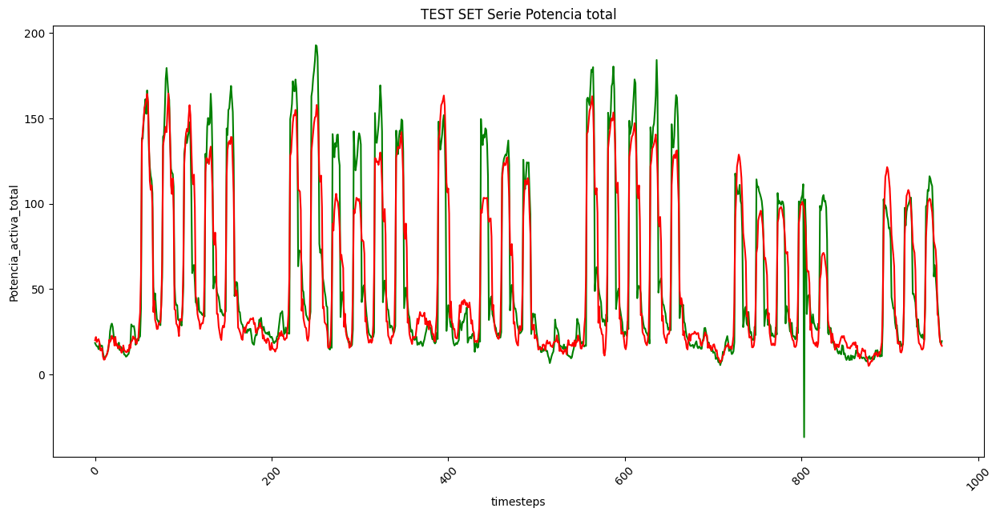

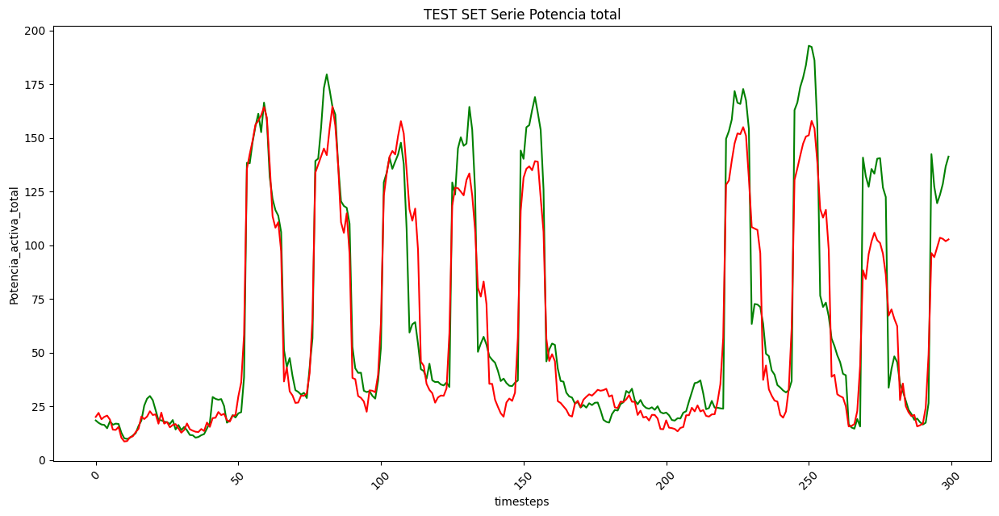


 Mean Validation error of all folds: 0.0799

 Mean Test error of all folds: 0.1501
-----------------------MODEL 3-----------------------------
--MODEL 3-- FOLD 1
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.046
test_error: 0.135
MAPE fold_1 desescalado: 27.04%


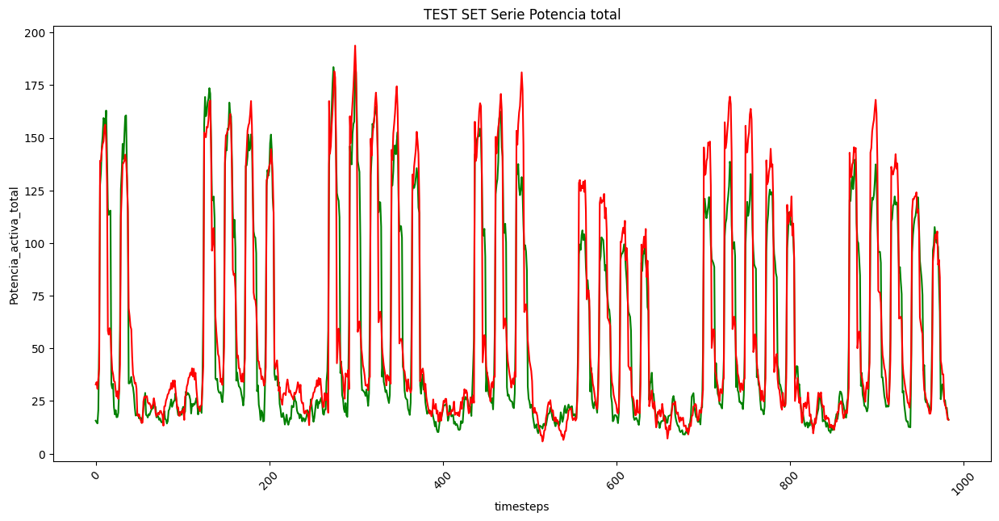

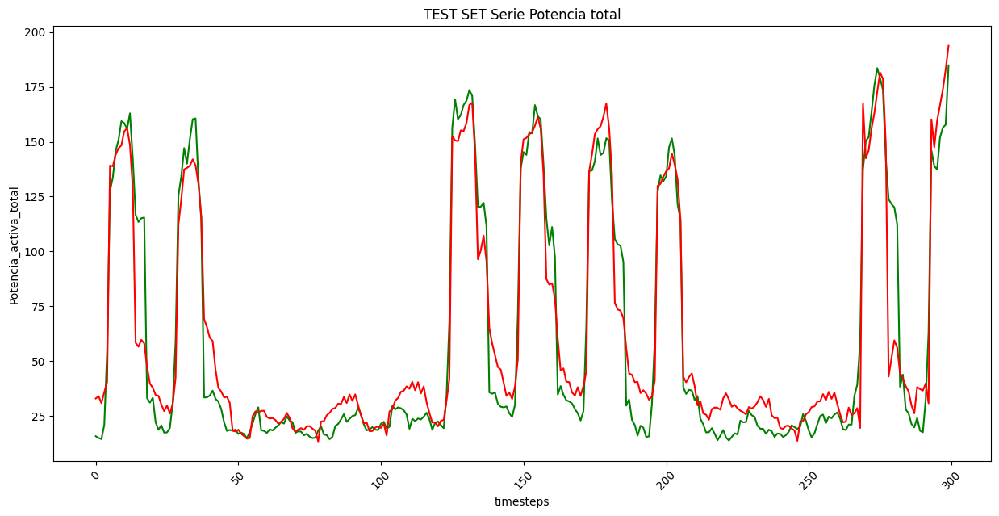

--MODEL 3-- FOLD 2
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.117
test_error: 0.059
MAPE fold_2 desescalado: 21.29%


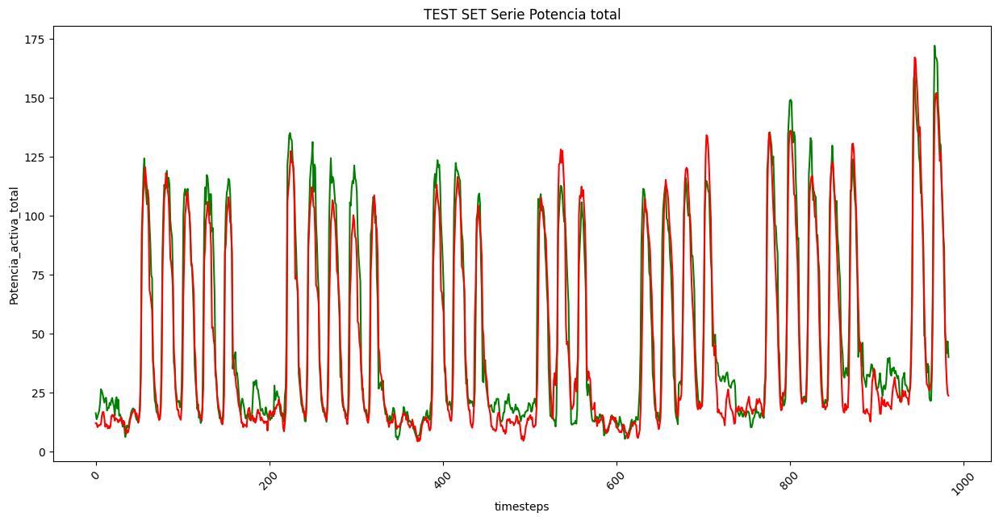

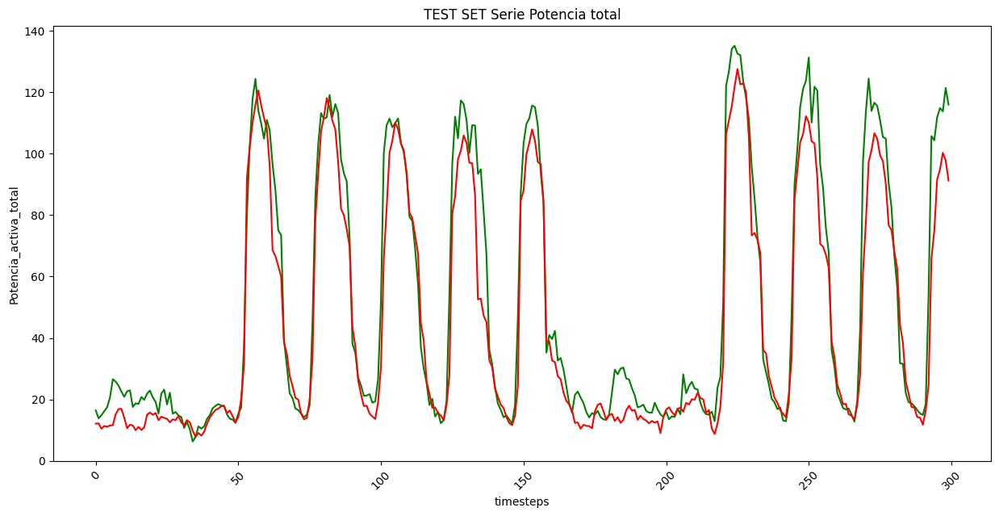

--MODEL 3-- FOLD 3
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.063
test_error: 0.393
MAPE fold_3 desescalado: 33.21%


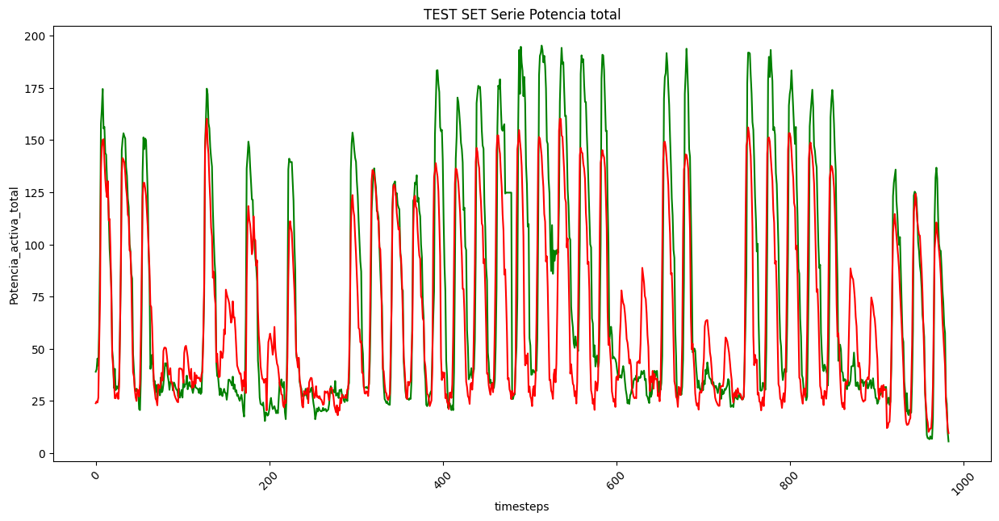

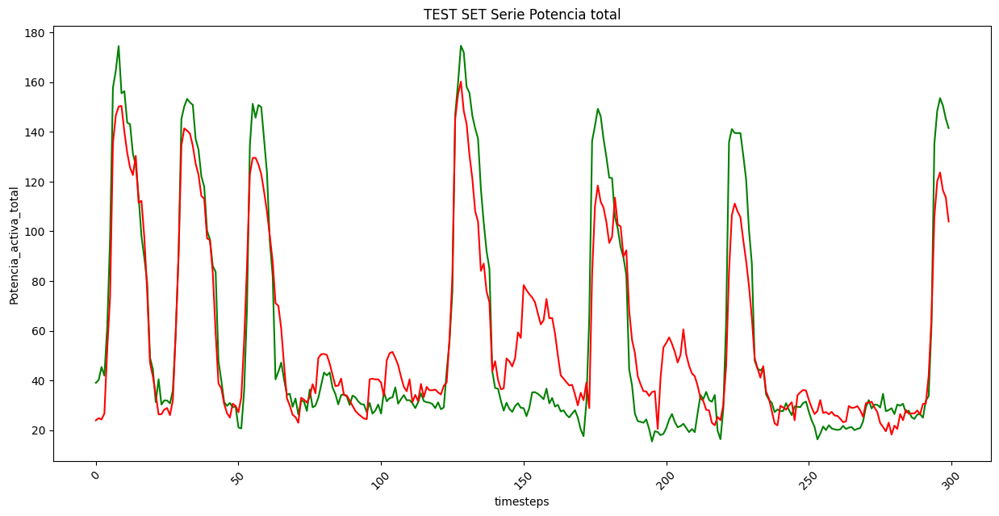

--MODEL 3-- FOLD 4
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.118
test_error: 0.050
MAPE fold_4 desescalado: 76.07%


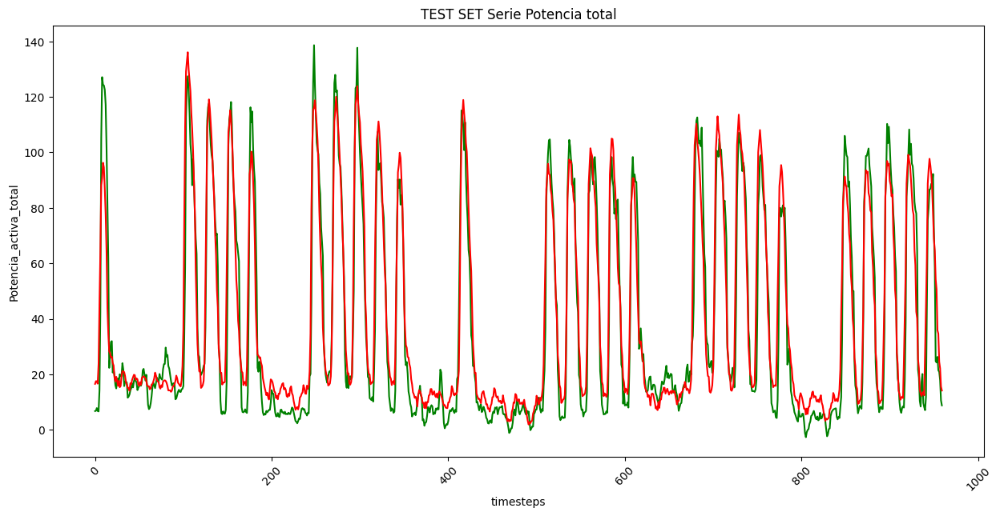

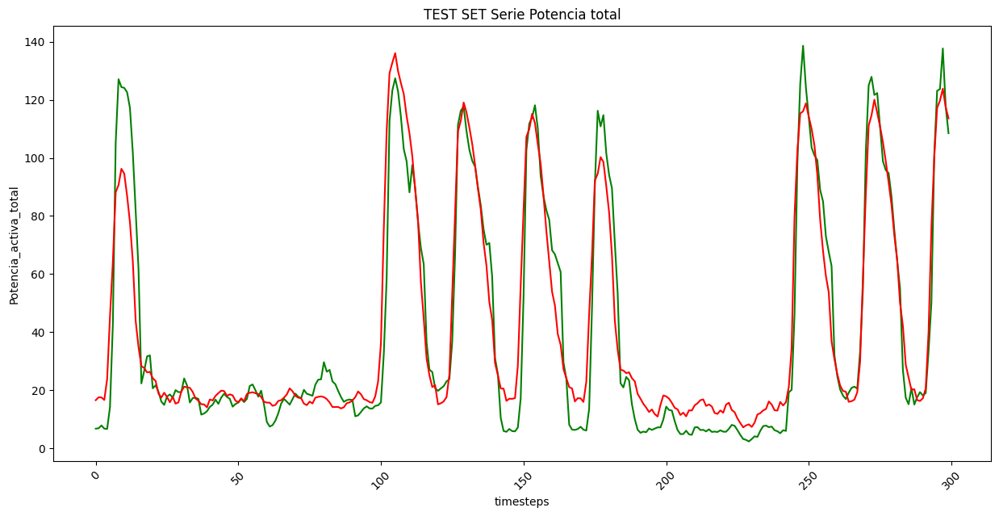

--MODEL 3-- FOLD 5
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.070
test_error: 0.149
MAPE fold_5 desescalado: 82.52%


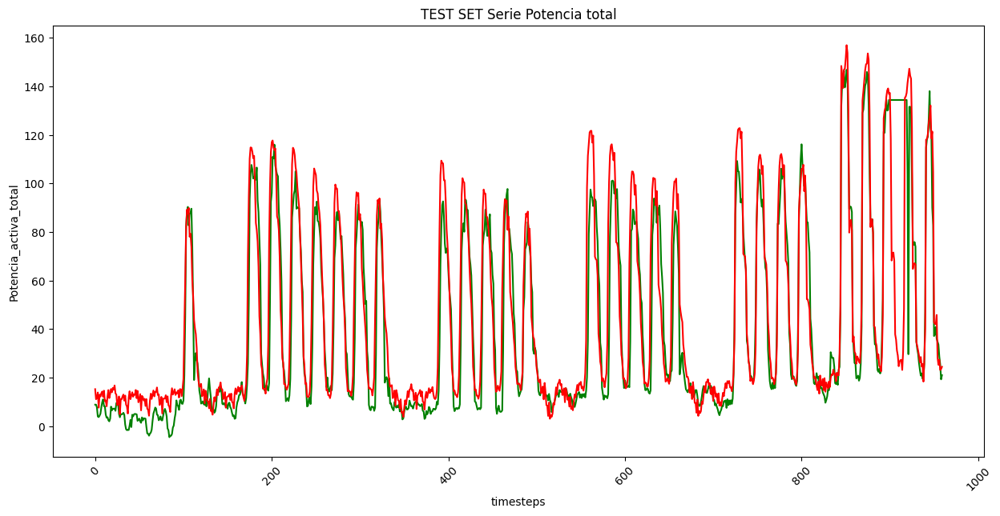

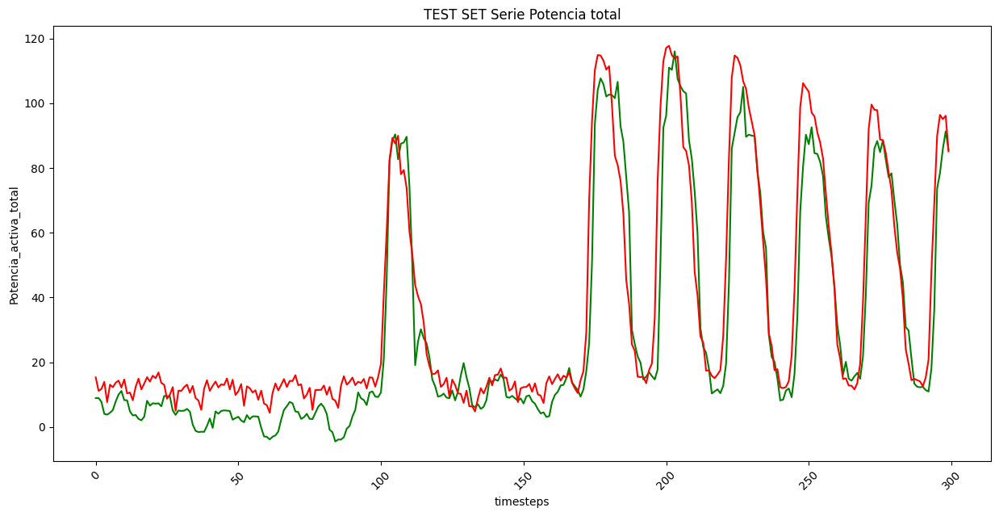

--MODEL 3-- FOLD 6
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.087
test_error: 0.160
MAPE fold_6 desescalado: 30.58%


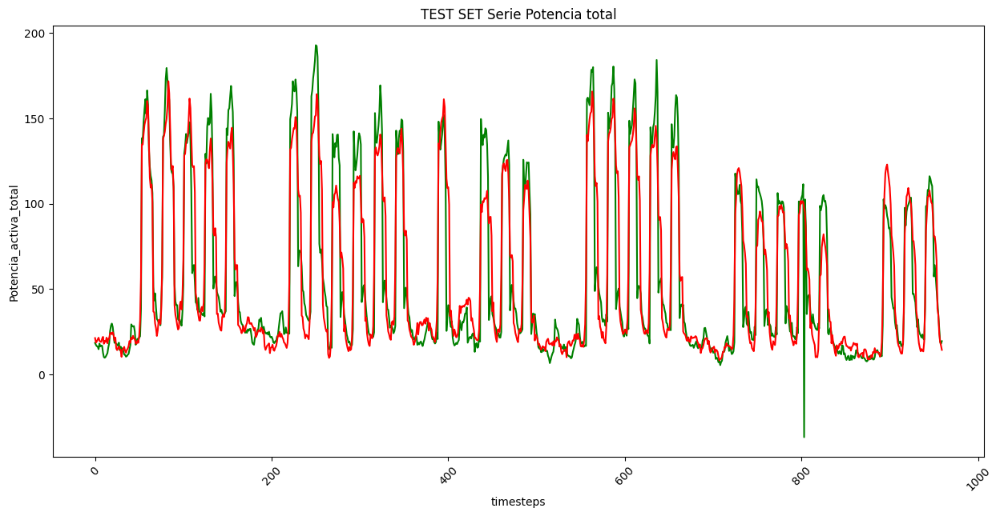

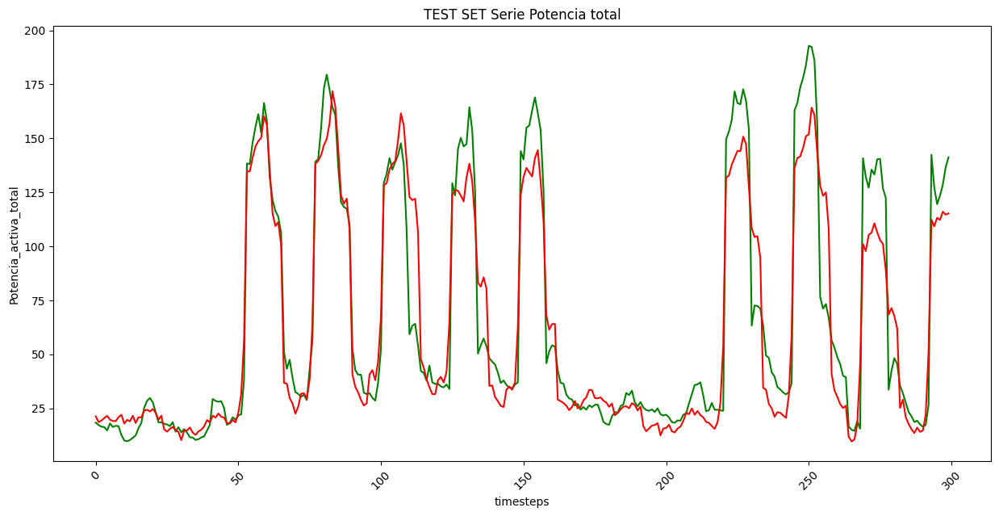


 Mean Validation error of all folds: 0.0832

 Mean Test error of all folds: 0.1576
-----------------------MODEL 4-----------------------------
--MODEL 4-- FOLD 1
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.037
test_error: 0.094
MAPE fold_1 desescalado: 23.43%


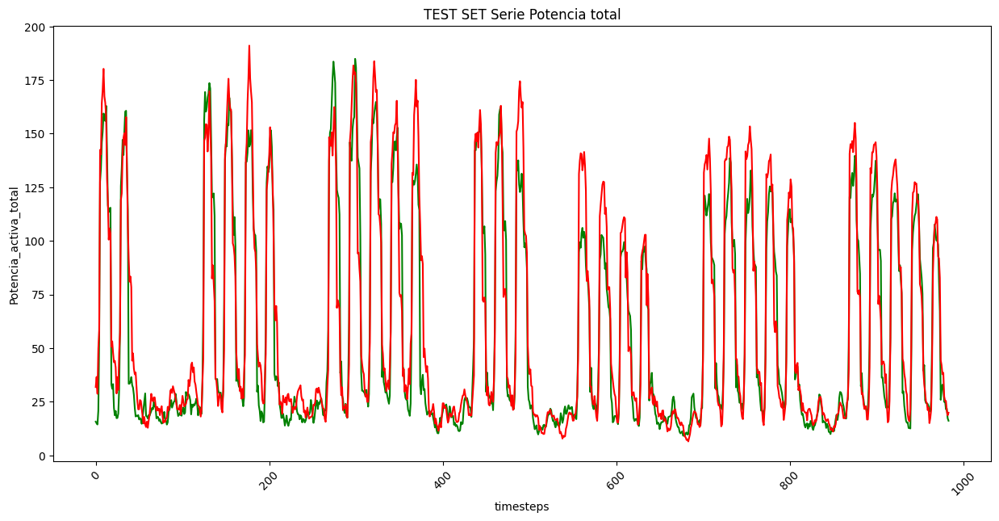

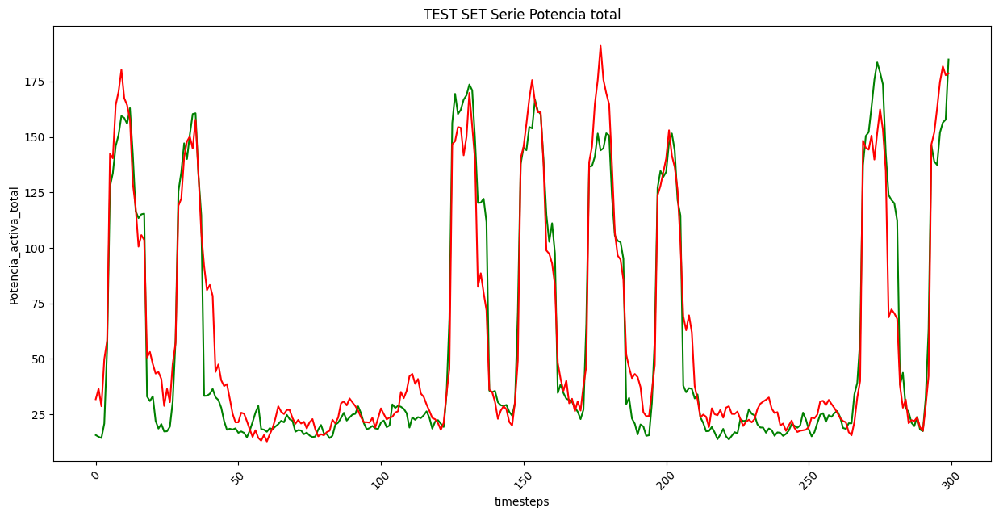

--MODEL 4-- FOLD 2
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.104
test_error: 0.066
MAPE fold_2 desescalado: 23.61%


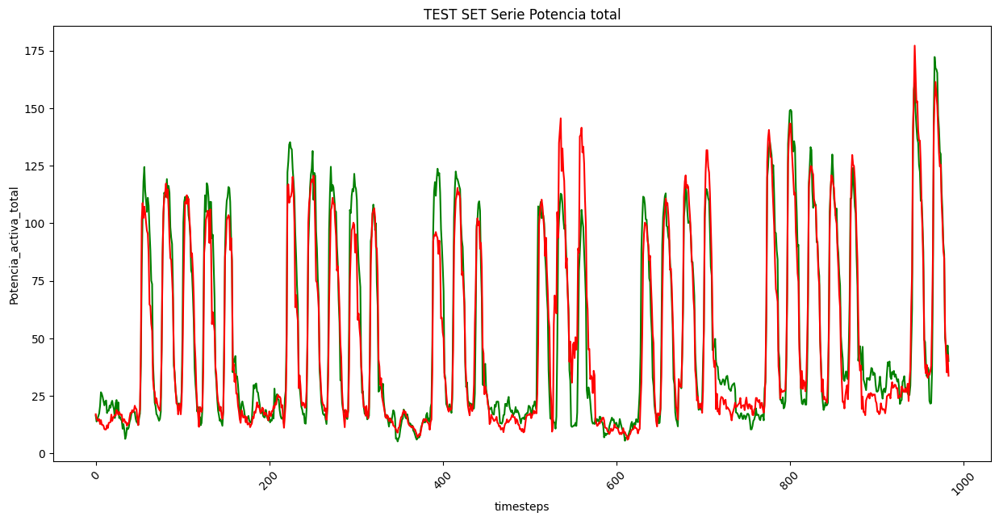

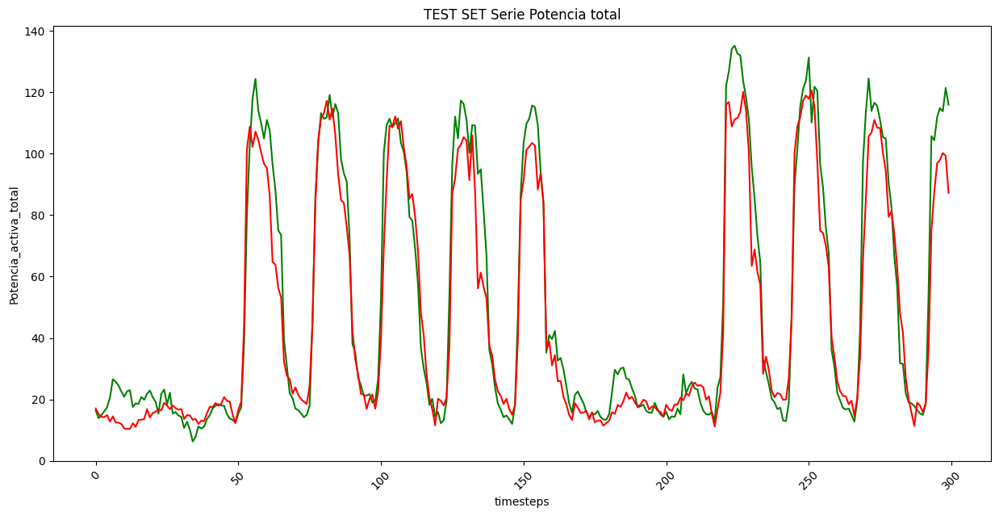

--MODEL 4-- FOLD 3
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.049
test_error: 0.336
MAPE fold_3 desescalado: 32.42%


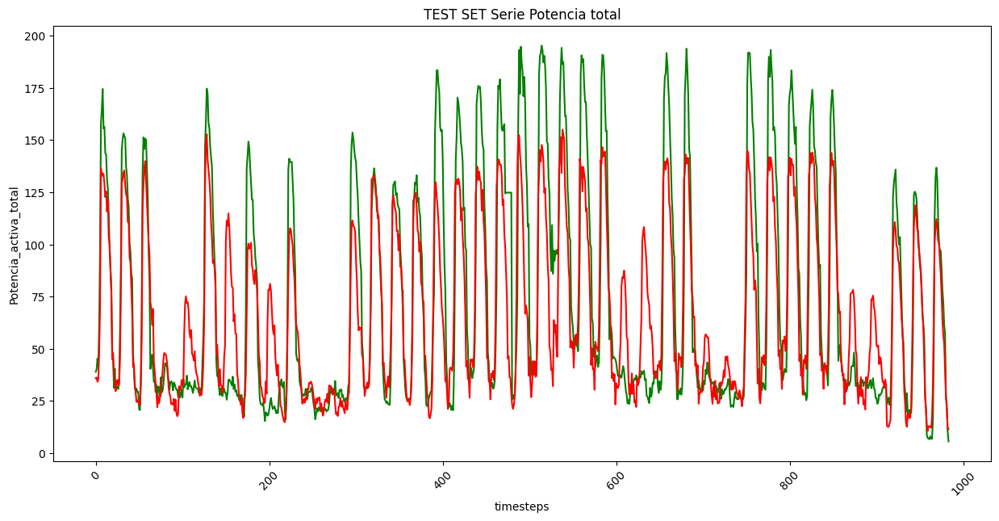

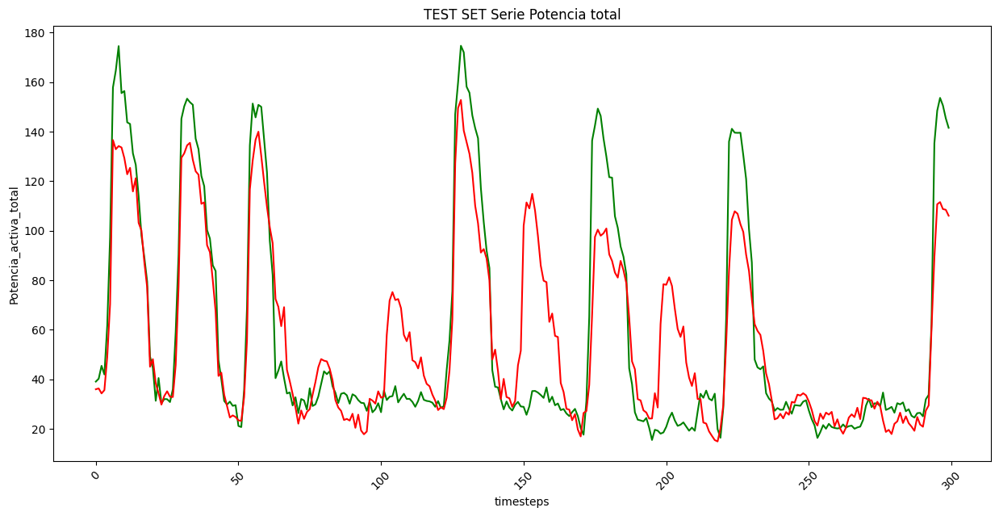

--MODEL 4-- FOLD 4
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.115
test_error: 0.071
MAPE fold_4 desescalado: 105.00%


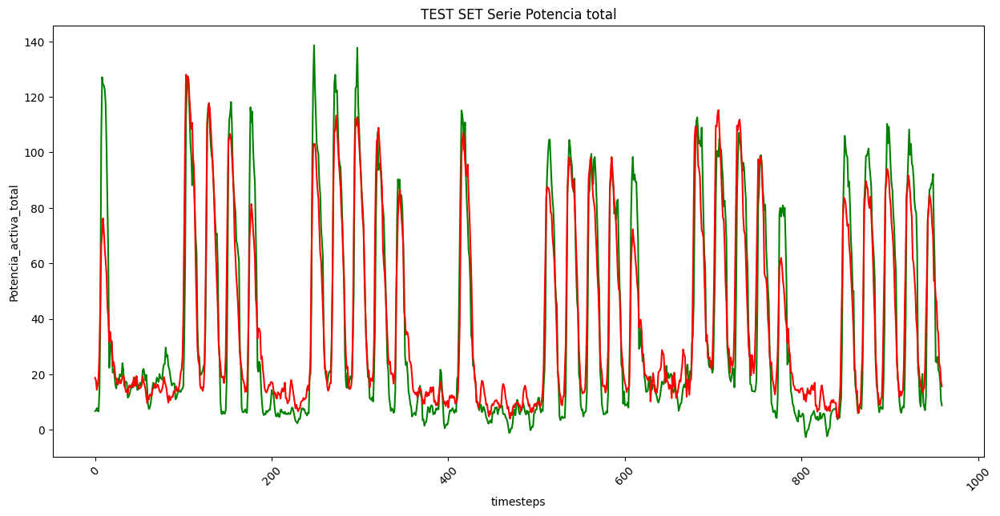

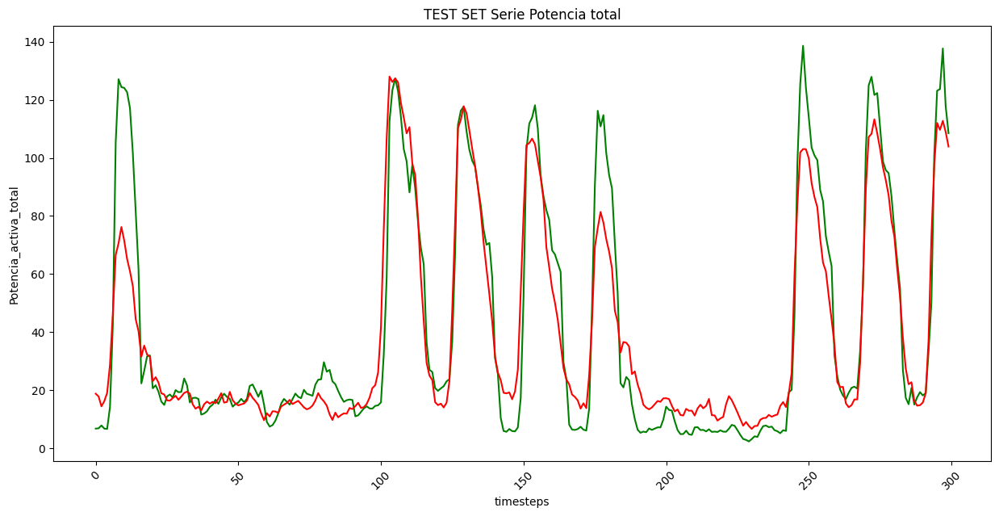

--MODEL 4-- FOLD 5
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.058
test_error: 0.110
MAPE fold_5 desescalado: 41.70%


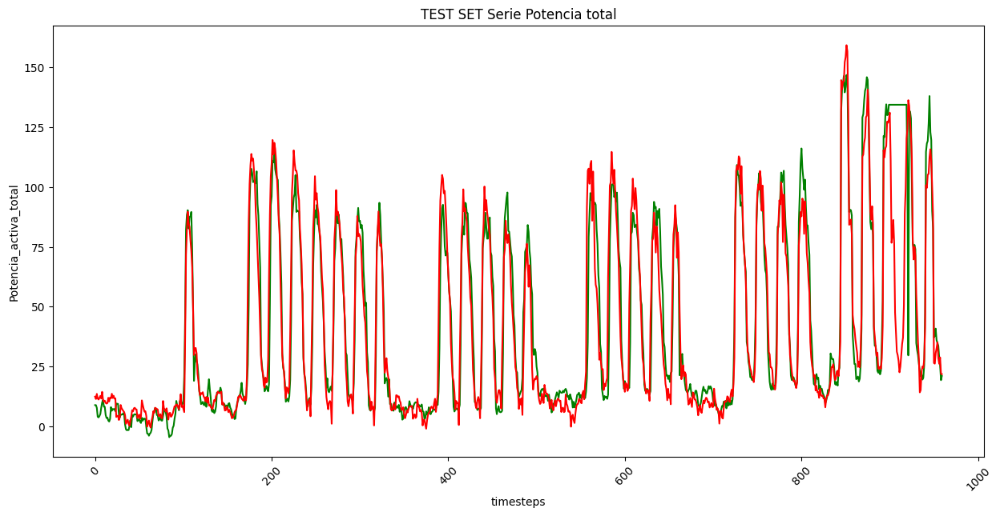

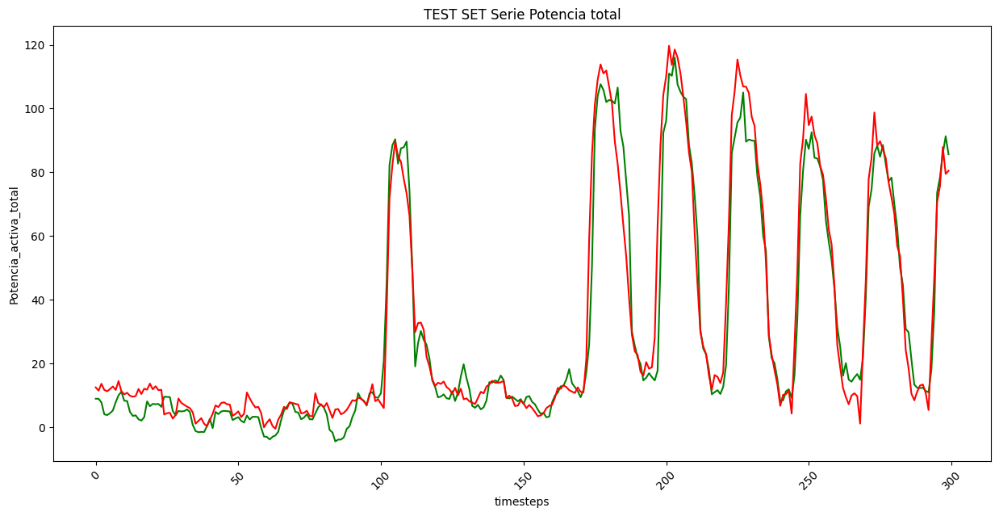

--MODEL 4-- FOLD 6
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.083
test_error: 0.173
MAPE fold_6 desescalado: 28.91%


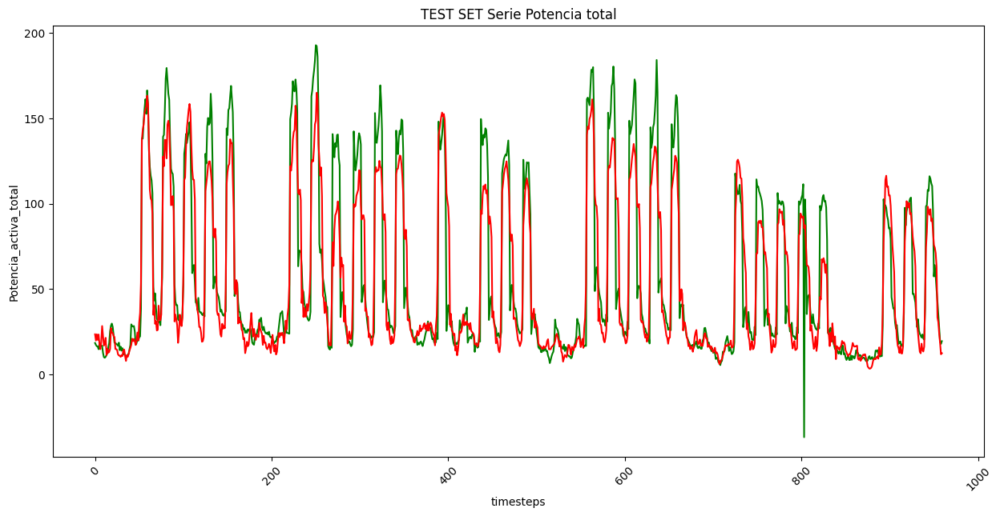

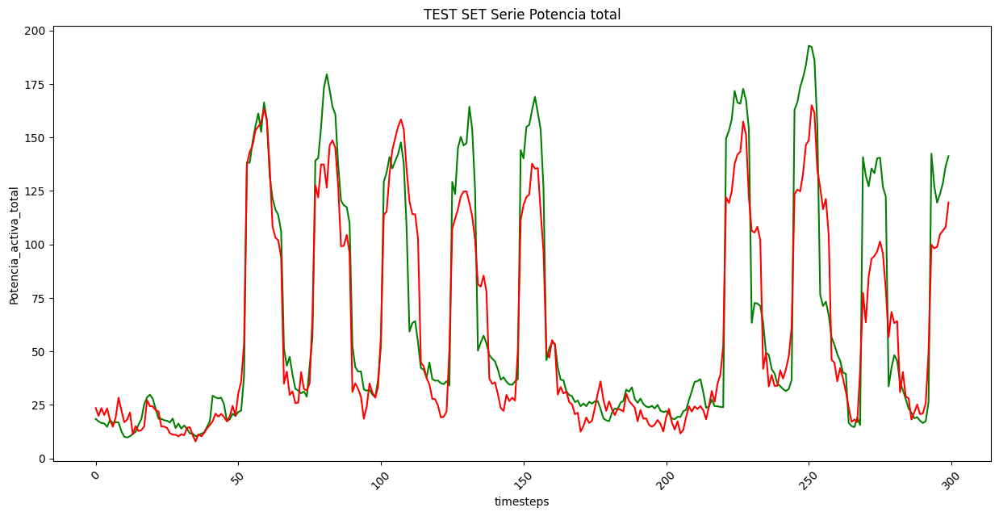


 Mean Validation error of all folds: 0.0742

 Mean Test error of all folds: 0.1417
-----------------------MODEL 5-----------------------------
--MODEL 5-- FOLD 1
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.040
test_error: 0.118
MAPE fold_1 desescalado: 24.68%


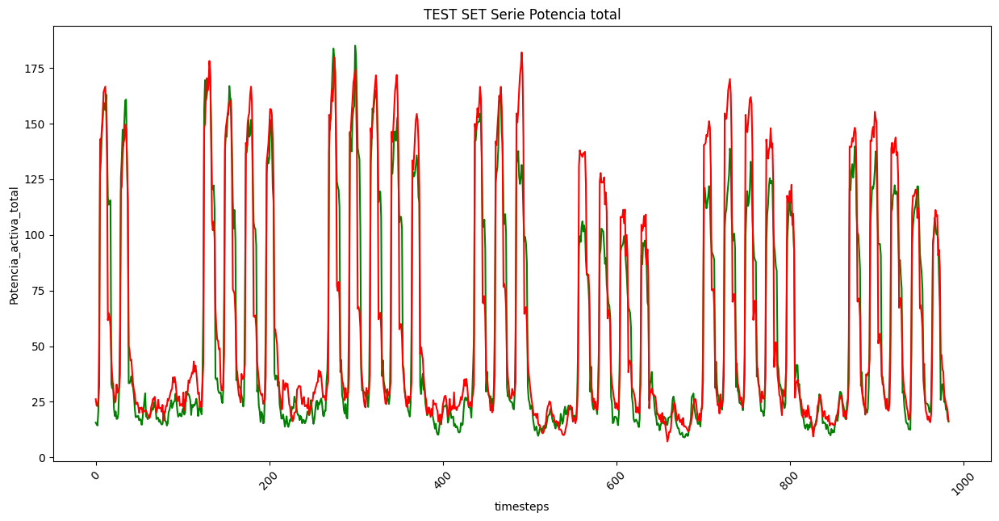

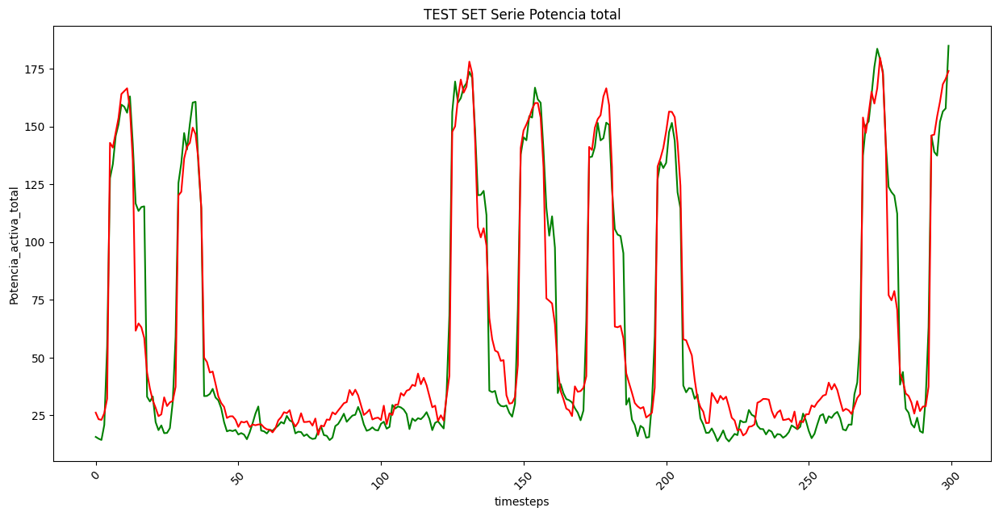

--MODEL 5-- FOLD 2
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.123
test_error: 0.060
MAPE fold_2 desescalado: 25.03%


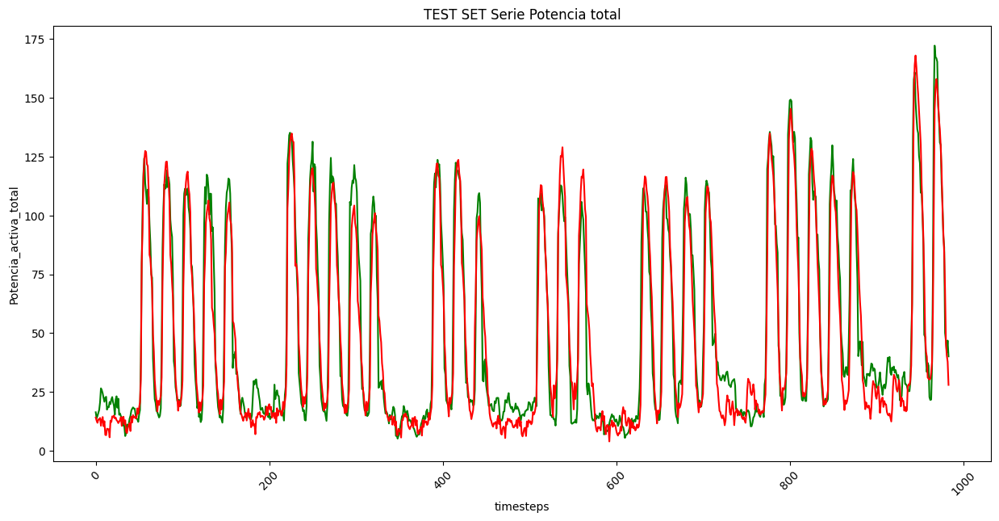

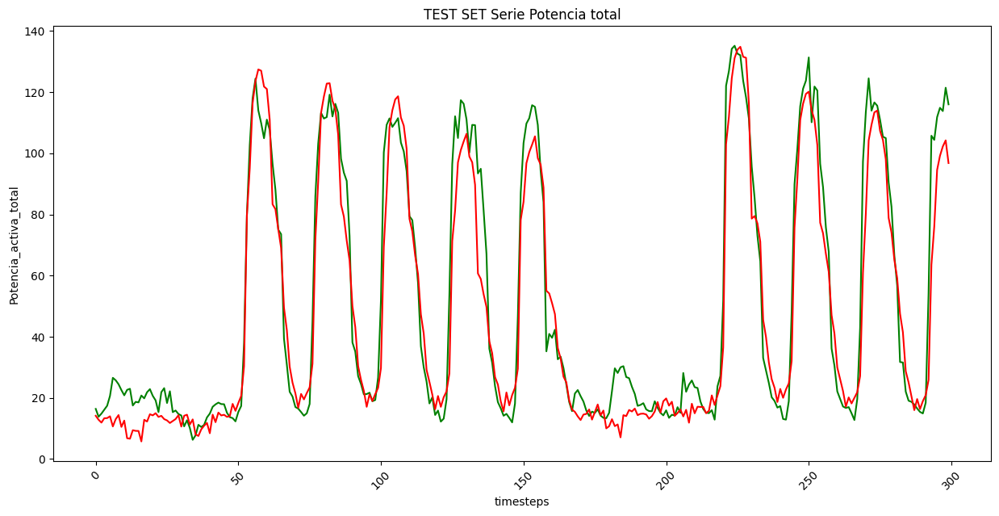

--MODEL 5-- FOLD 3
Train shapes:   Condition:(161, 11)  Seq:(161, 24, 17)  target:(161, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Validation_error: 0.053
test_error: 0.351
MAPE fold_3 desescalado: 31.77%


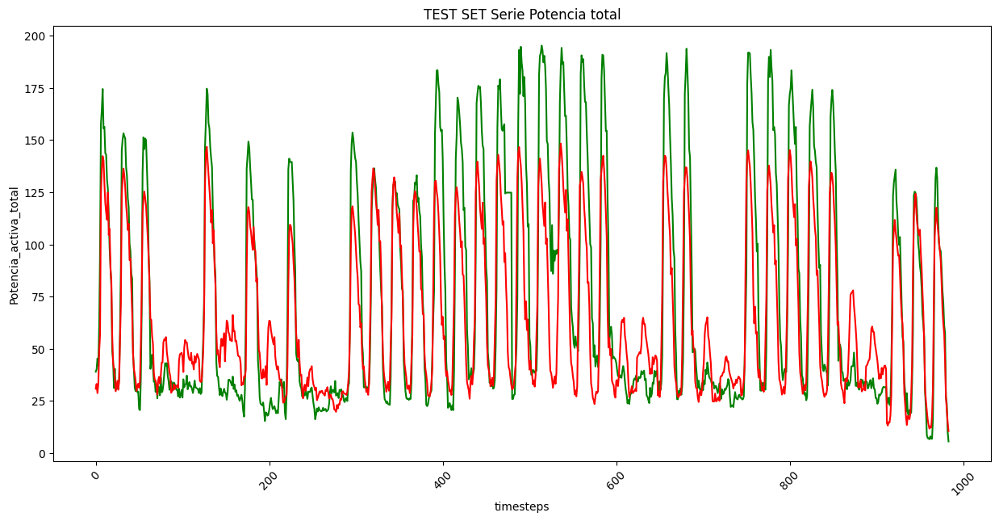

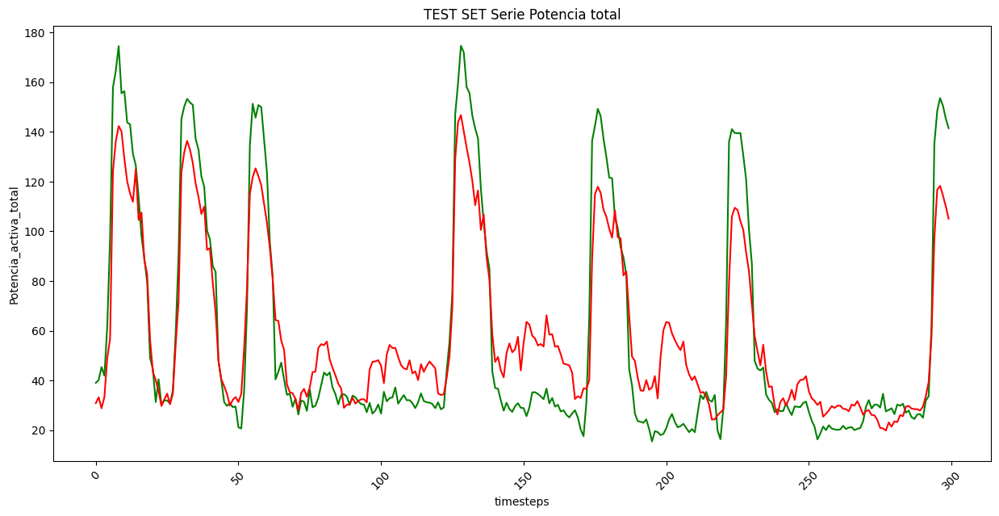

--MODEL 5-- FOLD 4
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.106
test_error: 0.044
MAPE fold_4 desescalado: 87.44%


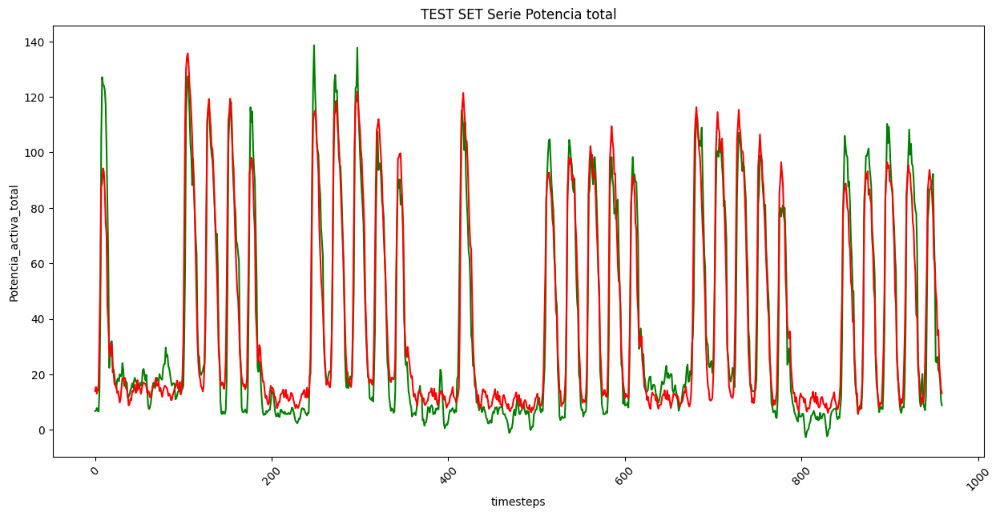

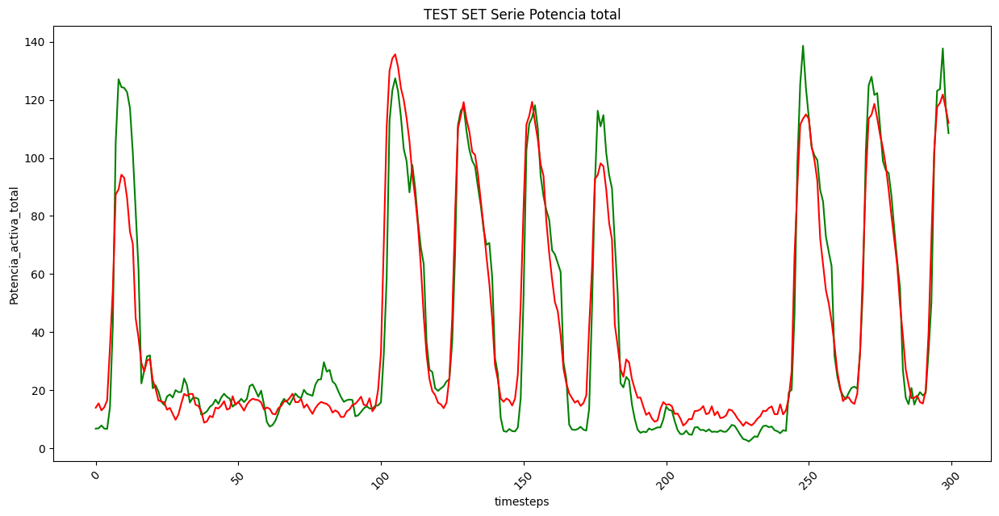

--MODEL 5-- FOLD 5
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.069
test_error: 0.123
MAPE fold_5 desescalado: 60.66%


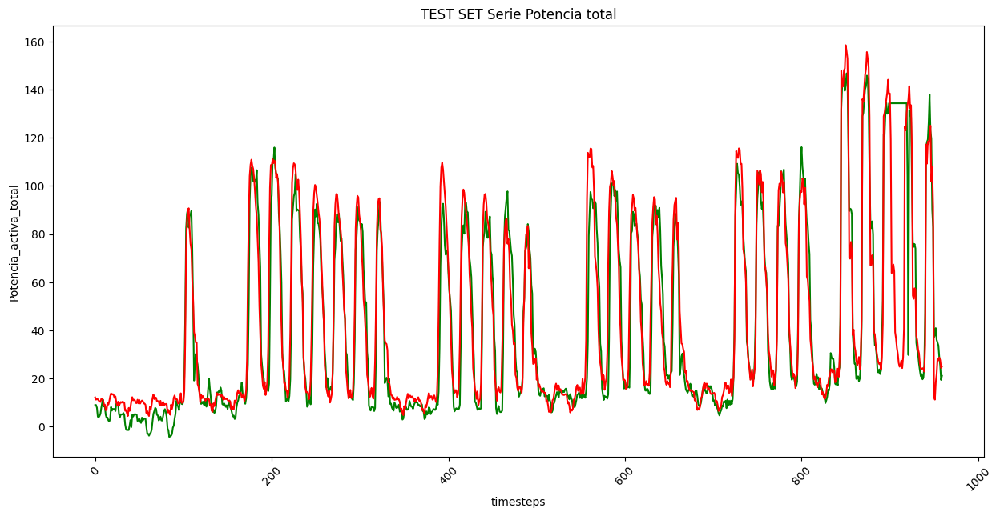

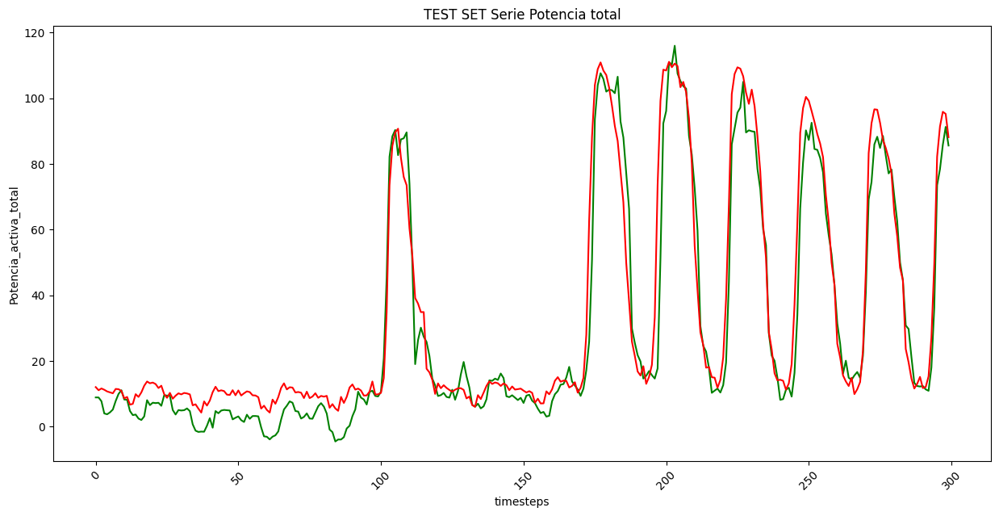

--MODEL 5-- FOLD 6
Train shapes:   Condition:(162, 11)  Seq:(162, 24, 17)  target:(162, 24)
Val shapes:   Condition:(41, 11)  Seq:(41, 24, 17)  target:(41, 24)
Test shapes:   Condition:(40, 11)  Seq:(40, 24, 17)  target:(40, 24)
Validation_error: 0.079
test_error: 0.141
MAPE fold_6 desescalado: 28.28%


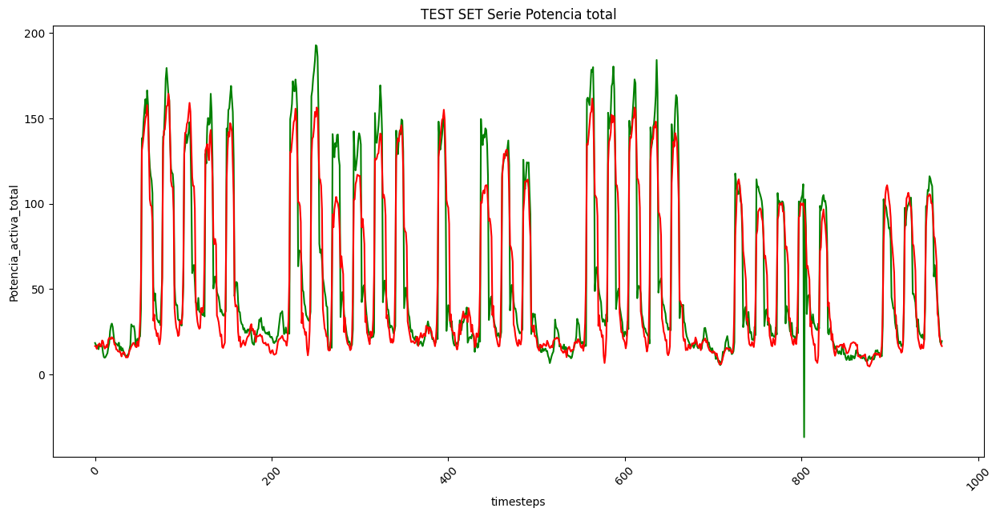

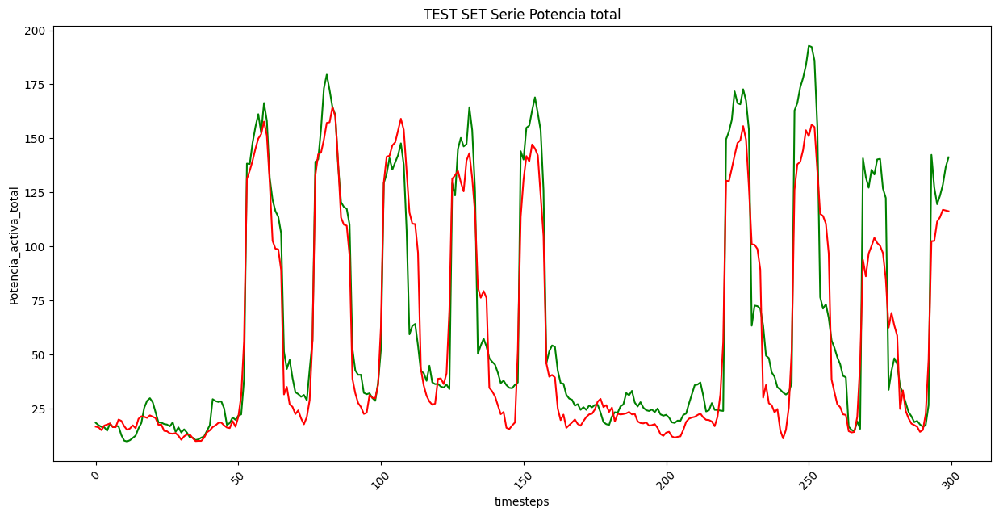


 Mean Validation error of all folds: 0.0782

 Mean Test error of all folds: 0.1396
architectures scores (mean_val_error_all_folds, mean_test_error_all_folds):  [(0.07665089642008145, 0.13798360526561737), (0.07994273056586583, 0.15005274737874666), (0.0832304401944081, 0.1575817589958509), (0.07418904391427834, 0.14168967803319296), (0.07822807257374127, 0.13956238888204098)]


In [38]:
# Evaluo las mejores config y hago la media de su Loss
# Se raliza una evaluacion con cross validation de de lon N modelos mejores que elijamos para evaluar manualmente la mejor arquitectura.
architectures_scores = []

model_count=1

for model_config in best_hps_loaded[0:5]:
    validation_error, test_error = [], []
    
    # Saco las variables de los hiperparametros para que formen parte del nombre del modelo guardado para cada fold
    Architecture = model_config.values['Architecture']
    Num_Layers = model_config.values['Num_Layers']
    hidden_units_1 = model_config.values['hidden_units_1']
    hidden_units_2 = model_config.values['hidden_units_2']
    Strides = model_config.values['Strides']
    Kernel_size = model_config.values['Kernel_size']
    
    print(f'-----------------------MODEL {model_count}-----------------------------')
    i=1
    for (train_fold, val_fold, test_fold) in zip(train_folds, val_folds, test_folds):
        print(f'--MODEL {model_count}-- FOLD {i}')
        # Pasamos los conjuntos a la funcion que los transforma en tf.dataset
        train, val, test, INPUT_1_SHAPE = get_dataset(train_fold, val_fold, test_fold)
        
        # Creamos el modelo de 0 para resetear los pesos
        model = create_model(model_config)

        # Configuro modelo y callbacks
        LR = 0.001
        model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LR), loss=LOSS)
        save_best_epoch = tf.keras.callbacks.ModelCheckpoint(filepath=f'./best_models/{Architecture}_{Num_Layers}_{hidden_units_1}_{hidden_units_2}_{Strides}_{Kernel_size}_Fold-{i}.h5', save_best_only=True, monitor='val_loss', mode='min')
        LR_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=7)

        # Entreno el modelo, Cargo el epoch con mejor fit a validación y lo guardo para cada Fold
        history = model.fit(x=train, validation_data=val, epochs=100, batch_size=BATCH_SIZE, callbacks=[save_best_epoch, LR_scheduler], verbose=0)
        model = tf.keras.models.load_model(f'./best_models/{Architecture}_{Num_Layers}_{hidden_units_1}_{hidden_units_2}_{Strides}_{Kernel_size}_Fold-{i}.h5', custom_objects={'ConditionalRecurrent':ConditionalRecurrent})
        validation_error.append(model.evaluate(val, verbose=0))
        print(f'Validation_error: {model.evaluate(val, verbose=0):.3f}')
        test_error.append(model.evaluate(test, verbose=0))
        print(f'test_error: {model.evaluate(test, verbose=0):.3f}')
        
        
        # PINTAMOS LAS PREDICCIONES DEL MODELO
        # Desescalamos las predicciones y los datos reales
        #    Primero damos forma de serie a la predicción y a los datos reales
        predicciones_escaladas = model.predict(test, verbose=0).reshape(-1)
        valores_reales_escalados = np.concatenate([y for x, y in test], axis=0).reshape(-1)
        #   A continuacion restamos multiplicamos a cada valor por la desviación tipica de consumos y le sumamos la media
        valores_reales = valores_reales_escalados*desviacion_tipica + media
        predicciones = predicciones_escaladas*desviacion_tipica + media
        
        MAPE = np.mean(np.abs((valores_reales - predicciones)/valores_reales) * 100)
        print(f"MAPE fold_{i} desescalado: {MAPE:.2f}%")
        
        # Pintamos 
        pintar_predicciones(valores_reales, predicciones)
        i+=1
        
        
    print(f'\n Mean Validation error of all folds: {np.mean(validation_error):.4f}')
    print(f'\n Mean Test error of all folds: {np.mean(test_error):.4f}')
    architectures_scores.append((np.mean(test_error)))
    
    
    model_count+=1
    
print(f'architectures scores :  {architectures_scores}')

In [326]:
# Seleccionamos la arquitectura ganadora
winner = best_hps[np.argmin([test for val, test in architectures_scores])]

print(f"La arquitectura gandora ha sido la nº{np.argmin([test for val, test in architectures_scores]) + 1}")
print(f"Media de error entre los {FOLDS} Folds = {np.min([test for val, test in architectures_scores])}")
print(f"La arquitectura: {winner.values}")

La arquitectura gandora ha sido la nº3
Media de error entre los 6 Folds = 0.0709087314705054
La arquitectura: {'Architecture': 'conv-lstm-conditional', 'Num_Layers': 1, 'Dropout_rate': 0.2, 'hidden_units_1': 900, 'Filters': 400, 'Kernel_size': 7, 'Strides': 7, 'hidden_units_2': 1000}
